In [455]:
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np


df = pd.read_pickle('dataset/train_dataset.pkl')

pd.set_option("display.max_columns", None)
pd.set_option('display.max_colwidth', None) #50 for truncated view, -1 for full view

<font size ="6"> Process-aware ML Based Intrusion Detection for Industrial Control Systems </font>

# Useful function

In [456]:
def get_train_test_dataset(df):
    split_date = '2015-12-28 10:00:00'
    data_train = df.loc[df['Timestamp'] <= split_date].copy()
    data_test = df.loc[df['Timestamp'] > split_date].copy()
    return data_train, data_test

In [ ]:
df_cols = pd.read_pickle('dataset/train_dataset.pkl')

cols_numeric = list(df_cols.columns)
cols_numeric.remove('Timestamp')
cols_numeric.remove('index')
cols_numeric.remove('attack')
cols_numeric.remove('Normal/Attack')

cols_discrete = []
cols_continuous = []
for col in cols_numeric:
    if len(df_cols[col].unique()) > 5:
        cols_continuous.append(col)
    else:
        cols_discrete.append(col)

In [ ]:
attack_df = pd.read_csv('attacks_df.csv')
attack_df['start_time'] = pd.to_datetime(attack_df['start_time'])
attack_df['end_time'] = pd.to_datetime(attack_df['end_time'])

def get_timestamp_attack(index_attack, offset):
    index_attack = attack_df[attack_df['num_attack'] == index_attack].index[0]
    index_start = df[df['Timestamp'] == attack_df.iloc[index_attack]['start_time']].index[0] - offset
    if offset + df[df['Timestamp'] == attack_df.iloc[index_attack]['end_time']].index[0] > len(df):
        offset = len(df) - df[df['Timestamp'] == attack_df.iloc[index_attack]['end_time']].index[0]
    index_end = df[df['Timestamp'] == attack_df.iloc[index_attack]['end_time']].index[0] + offset
    return index_start, index_end

In [ ]:

def get_index_attack(attack_name):
    list_attack_index = []
    for i, attack in zip(attack_df['num_attack'], attack_df['attack_point']):
        attack = attack.replace('-', '')
        if attack_name in attack:
            list_attack_index.append(i)
    return list_attack_index

In [ ]:
def get_moving_median(df, col, n):
    median_moving = []
    for i in range(0, len(df) - n, n):
        med = np.median(df.iloc[i:i+n][col])
        for j in range(n):
            median_moving.append(med)
    for j in range(19):
            median_moving.append(med)
    df_median_moving = pd.DataFrame(median_moving, columns=['median_moving'])
    return df_median_moving


def get_null(df, n):
    diff = np.diff(df['median_moving'])
    arr_diff = pd.DataFrame(diff, columns=['diff'])
    arr = pd.DataFrame( arr_diff[(arr_diff['diff'] <= 2) | (arr_diff['diff'] >= -2)] ).astype(dtype='int')
    
    up_down = []
    accumulator = 0
    for i in range(n-1, len(arr), n):
        ar = arr.iloc[i].values
        accumulator = 0 if ar != 0 else accumulator + 1
        for j in range(0, n):
            up_down.append(accumulator)
    for j in range(19):
        up_down.append(accumulator)
    return pd.DataFrame(up_down, columns=['null'])

def get_up_down(df, sign, n):
    arr = pd.DataFrame(sign * np.diff(df['median_moving']) >= sign * -2).astype(dtype='int')

    up_down = []
    accumulator = 0
    for i in range(n-1, len(arr), n):
        ar = arr.iloc[i].values
        if ar <= 0:
            accumulator = 0
        elif ar > 0:
            accumulator += sign
            
        for j in range(0, n):
            up_down.append(accumulator)
        
    for j in range(19):
        up_down.append(accumulator)
    return pd.DataFrame(up_down, columns=['up_down'])

def get_up_down_one(df, n):
    up = get_up_down(df, 1, n)
    down = get_up_down(df, -1, n)
    return pd.DataFrame(up['up_down'] + down['up_down'], columns=['up_down'])


# Feature Detection

In [ ]:
train, test = get_train_test_dataset(df)

In [ ]:
# Interquartile Range
def IQR_keep(df, col):

    Q1 = np.percentile(df[col], 25)
    Q3 = np.percentile(df[col], 75)
    IQR = Q3 - Q1

    # Above Upper bound
    upper = df[col] >= (Q3+1.5*IQR)

    # Below Lower bound
    lower = df[col] <= (Q1-1.5*IQR)

    keep = ~upper & ~lower
    return Q1, Q3, IQR, keep

## Detection of discrete constant and not constant feature

In [ ]:
df_var_zero_mean = pd.DataFrame(columns=['col', 'mean'])

cols_var_zero_discrete = []
cols_not_var_zero_discrete = []
for col in cols_discrete:
    if np.var(train[col]) != 0:
        
        Q1, Q3, IQR, keep = IQR_keep(train, col)
        data = train[keep][col]
        if np.var(data) != 0:
            cols_not_var_zero_discrete.append(col)
        else:
            cols_var_zero_discrete.append(col)
            df_var_zero_mean = pd.concat(objs=[df_var_zero_mean, pd.DataFrame({'col': [col], 'mean': [data.mean()]})], axis=0, ignore_index=True)
    else:
        cols_var_zero_discrete.append(col)
        df_var_zero_mean = pd.concat(objs=[df_var_zero_mean, pd.DataFrame({'col': [col], 'mean': [train[col].mean()]})], axis=0, ignore_index=True)

## Detection of cylic & acyclic feature with Autocorrelation

In [809]:
def get_delay_embedding(col, LAG):
    time_series = train[col]

    delay_coordinates = [  
                time_series[0 * LAG:len(time_series) - LAG * 1], # t
                time_series[1 * LAG:len(time_series) - LAG * 0], # t-T
            ]
    
    return delay_coordinates

In [811]:

list_corr = []
for LAG in range(1, 100000, 100):
    delay_coordinates = get_delay_embedding(f'{col}', LAG)
    corr = np.corrcoef([delay_coordinates[0], delay_coordinates[1]])[0, 1]
    list_corr.append(corr)

corr_df = pd.DataFrame(list_corr, columns=['corr'])
corr_df['lag'] = (corr_df.index + 1) * 100


In [813]:
index = []
previous_corr = corr_df['corr'][0]
for i in range(1, len(corr_df['corr'])):
    corr = corr_df['corr'][i]
    if corr > 0 and previous_corr < 0:
        index.append(corr_df['lag'][i])
    previous_corr = corr

df_index = pd.DataFrame(index, columns=['index'])

/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/3132382702.py:44: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  plt.subplots_adjust(bottom=0, top=1.5)


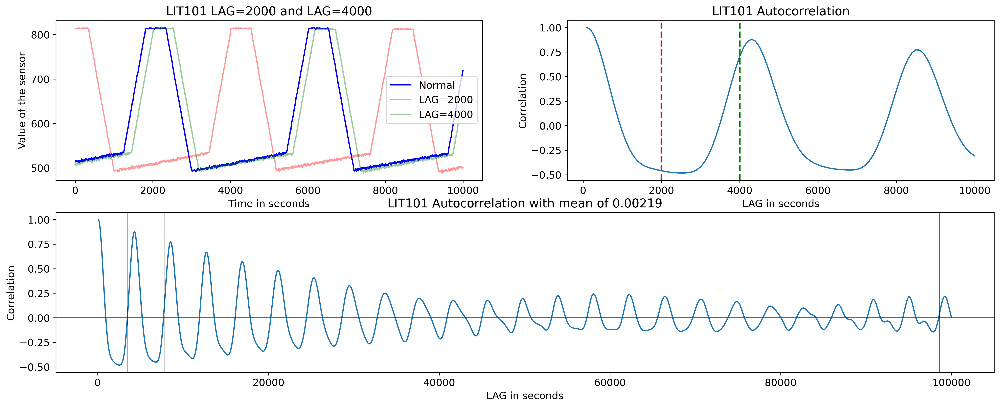

In [814]:
fig = plt.figure(figsize=(20, 6), dpi=300, constrained_layout=True)
gs = fig.add_gridspec(3, 2)

col = 'LIT101'
index_start = 30000
index_end = 40000

ax1 = fig.add_subplot(gs[0,:-1])

delay_coordinates = get_delay_embedding(f'{col}', 2000)

ax1.plot(delay_coordinates[0][index_start:index_end].reset_index(drop=True), color='blue')
ax1.plot(delay_coordinates[1][index_start:index_end].reset_index(drop=True), color='red', alpha=0.4)
ax1.set_title(f'{col} LAG=2000')

ax2 = fig.add_subplot(gs[0:1,-1])
ax2.plot(corr_df.iloc[0:100]['lag'], corr_df.iloc[0:100]['corr'])
ax2.axvline(x=2000, color='red', linestyle='--', linewidth=2)
ax2.axvline(x=4000, color='green', linestyle='--', linewidth=2)

ax2.set_title(f'{col} Autocorrelation')
ax2.set_xlabel('LAG in seconds')
ax2.set_ylabel('Correlation')

delay_coordinates = get_delay_embedding(f'{col}', 4000)

ax1.plot(delay_coordinates[1][index_start:index_end].reset_index(drop=True), color='green', alpha=0.4)
ax1.set_title(f'{col} LAG=2000 and LAG=4000')
ax1.set_xlabel('Time in seconds')
ax1.set_ylabel('Value of the sensor')
ax1.legend(['Normal','LAG=2000', 'LAG=4000'])

ax5 = fig.add_subplot(gs[1,:])

ax5.plot(corr_df['lag'], corr_df['corr'])
ax5.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.5)
ax5.axhline(y=np.mean(corr_df['corr']), color='red', linestyle='-', linewidth=1, alpha=0.5)
for i in range(len(df_index)):
    ax5.axvline(x=df_index['index'][i], color='black', linestyle='-', linewidth=0.2)
ax5.set_title(f'{col} Autocorrelation with mean of {np.round(np.mean(corr_df["corr"]), 5)}')
ax5.set_xlabel('LAG in seconds')
ax5.set_ylabel('Correlation')

plt.subplots_adjust(bottom=0, top=1.5)


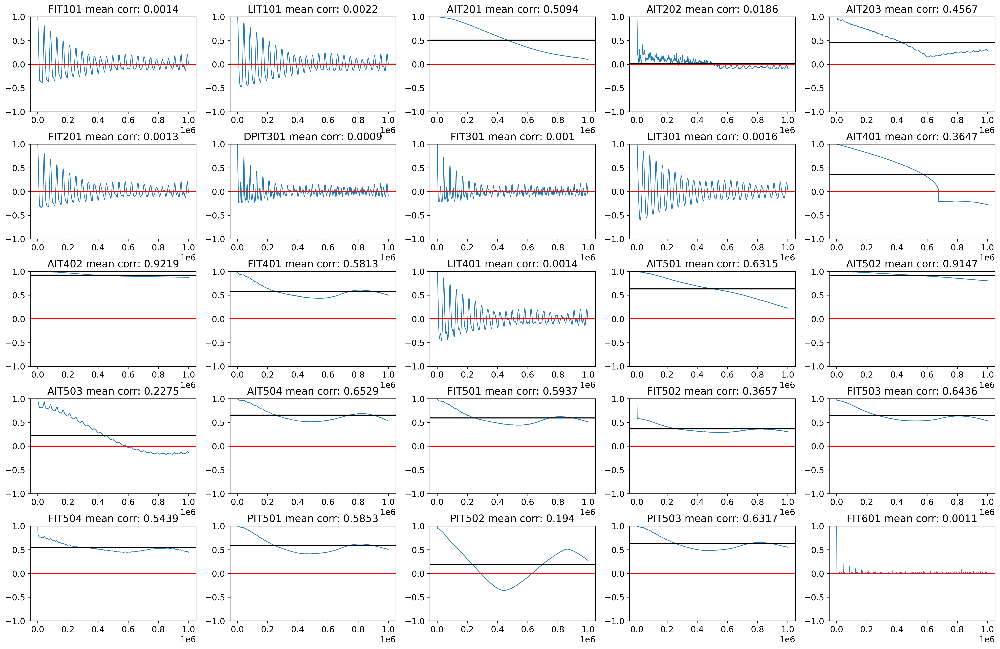

In [815]:
fig, ax = plt.subplots(5, 5, figsize=(20, 10), dpi=300)
fig.tight_layout()

df_autocorrelation = pd.DataFrame()


for i, col in enumerate(cols_continuous):
    list_corr = []
    for LAG in range(1, 100000, 100):
        delay_coordinates = get_delay_embedding(f'{col}', LAG)
        corr = np.corrcoef([delay_coordinates[0], delay_coordinates[1]])[0, 1]
        list_corr.append(corr)
    
    corr_df = pd.DataFrame(list_corr, columns=['corr'])
    corr_df['lag'] = (corr_df.index + 1) * 1000
    
    # fig, ax = plt.subplots(figsize=(20, 5))
    ax[i // 5, i % 5].plot(corr_df['lag'], corr_df['corr'], linewidth=1)
    ax[i // 5, i % 5].axhline(y=np.mean(corr_df['corr']), color='black', linestyle='-')
    ax[i // 5, i % 5].axhline(y=0, color='r', linestyle='-')
    ax[i // 5, i % 5].set_ylim(-1, 1)
    ax[i // 5, i % 5].set_title(f'{col} mean corr: {np.round(np.mean(corr_df["corr"]), 4)}')
    
    df_autocorrelation = pd.concat([df_autocorrelation, corr_df['corr']], axis=1)

plt.subplots_adjust(bottom=0, top=1.2)

# ~4min

In [ ]:
df_autocorrelation = pd.DataFrame()

for i, col in enumerate(cols_continuous):
    list_corr = []
    for LAG in range(1, int(len(train) / 2), 100):
        delay_coordinates = get_delay_embedding(f'{col}', LAG)
        corr = np.corrcoef([delay_coordinates[0], delay_coordinates[1]])[0, 1]
        list_corr.append(corr)
    
    corr_df = pd.DataFrame(list_corr, columns=['corr'])
    corr_df['lag'] = (corr_df.index + 1) * 1000
    
    df_autocorrelation = pd.concat([df_autocorrelation, corr_df['corr']], axis=1)

# ~4min

In [816]:
df_autocorrelation.columns = cols_continuous
df_metric_auto = df_autocorrelation.describe()
df_metric_auto = df_metric_auto.T

In [817]:
df_metric_auto

,count,mean,std,min,25%,50%,75%,max
FIT101,1000.0,0.001364,0.192759,-0.385564,-0.101865,-0.025184,0.103214,0.999725
LIT101,1000.0,0.002191,0.226684,-0.482178,-0.121879,-0.026396,0.122322,0.999993
AIT201,1000.0,0.509440,0.294373,0.102715,0.228320,0.466705,0.783014,0.999980
AIT202,1000.0,0.018573,0.099128,-0.099042,-0.063239,0.000627,0.079164,0.999874
AIT203,1000.0,0.456692,0.249248,0.153671,0.246698,0.354720,0.685722,0.999997
FIT201,1000.0,0.001315,0.180983,-0.336161,-0.098537,-0.026861,0.094636,0.999835
DPIT301,1000.0,0.000892,0.118305,-0.239641,-0.065110,-0.010570,0.047862,0.999751
FIT301,1000.0,0.001015,0.115434,-0.213211,-0.062713,-0.015132,0.044679,0.999580
LIT301,1000.0,0.001591,0.238569,-0.603317,-0.139491,-0.018436,0.140698,0.999990
AIT401,1000.0,0.364669,0.450295,-0.276561,-0.205687,0.478522,0.769590,0.999998


In [ ]:
# cols_cyclic = list(df_metric_auto[df_metric_auto['mean'] <= 1/100].index)
cols_cyclic = ['FIT101', 'LIT101', 'FIT201', 'DPIT301', 'FIT301', 'LIT301', 'LIT401', 'FIT601']

In [ ]:
# cols_acyclic = list(df_metric_auto[df_metric_auto['mean'] > 1/100].index)
cols_acyclic = [col for col in cols_continuous if col not in cols_cyclic]

In [ ]:
len(cols_var_zero_discrete), len(cols_not_var_zero_discrete), len(cols_cyclic), len(cols_acyclic)

(8, 12, 8, 17)

In [ ]:
len(cols_var_zero_discrete)+ len(cols_not_var_zero_discrete)+ len(cols_cyclic)+ len(cols_acyclic)

37

# Models

## Min-Max Model

In [ ]:
model_continuous_feature_check = pd.DataFrame(columns=['col', 'min', 'max'])

for col in cols_cyclic:
    col_df = pd.DataFrame({
        'col': [col],
        'min': [train[col].min()],
        'max': [train[col].max()]
    })
    model_continuous_feature_check = pd.concat(objs=[model_continuous_feature_check, col_df], axis=0, ignore_index=True)

model_continuous_feature_check

,col,min,max
0,FIT101,0.0000,2.745092
1,LIT101,486.3809,817.556500
2,FIT201,0.0000,2.487938
3,DPIT301,0.0000,20.555090
4,FIT301,0.0000,2.358774
5,LIT301,785.1353,1014.724000
6,LIT401,774.3399,1003.935000
7,FIT601,0.0000,1.746131


In [ ]:
def check_anomaly(df, col):
    df[f'anomaly_{col}'] = 0
    min = model_continuous_feature_check[model_continuous_feature_check['col'] == col]['min'].values[0]
    max = model_continuous_feature_check[model_continuous_feature_check['col'] == col]['max'].values[0]
    df.loc[(df[col] < min) | (df[col] > max), f'anomaly_{col}'] = 1
    return df

In [ ]:
df_cyclic = df[cols_cyclic+['Normal/Attack', 'attack', 'Timestamp']].copy()
df_cyclic['Normal/Attack_int'] = df_cyclic['Normal/Attack'].apply(lambda x: 1 if x == 'Attack' else 0)

for col in cols_cyclic:
    df_cyclic = check_anomaly(df_cyclic, col)

df_cyclic['min_max_anomaly'] = False
for col in cols_cyclic:
    df_cyclic['min_max_anomaly'] |= df_cyclic[f'anomaly_{col}'].astype(bool)

### Example of Min-Max model Detection

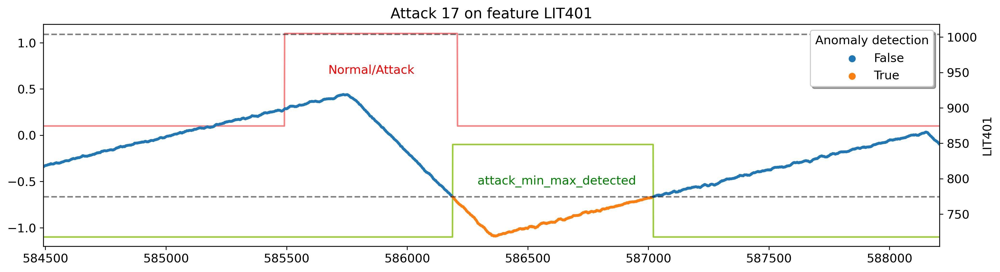

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(16, 4), dpi=300)

col = 'LIT401'
min_ = train[col].min()
max_ = train[col].max()

index_min, index_max = get_timestamp_attack(index_attack=17, offset=2000)
index_min+= 1000
ax.text(index_min + 1800, -0.5, f'attack_min_max_detected', horizontalalignment='left', verticalalignment='center', color='green')
ax.plot(df_cyclic.iloc[index_min:index_max]['min_max_anomaly'] - 1.1, color='yellowgreen', alpha=1)


ax.text(index_min + 1180, 0.7, f'Normal/Attack', horizontalalignment='left', verticalalignment='center', color='red')
ax.plot(df_cyclic['Normal/Attack_int'][index_min:index_max] + 0.1, color='red', alpha=0.5)

ax1 = ax.twinx()
data = df[col][index_min:index_max].to_frame()
data['anomaly_detection'] = False
data.loc[data['LIT401'] < min_, 'anomaly_detection'] = True

sns.scatterplot(data=data, x=data.index, y=data['LIT401'], hue=data['anomaly_detection'], ax=ax1, s=7, linewidth=0)
# ax1.plot(data, color='blue', alpha=0.5)
ax1.axhline(y=min_, color='black', alpha=0.5, linestyle='--')
ax1.axhline(y=max_, color='black', alpha=0.5, linestyle='--')

ax.set_ylim(-1.2, 1.2)
ax.set_xlim(index_min, index_max)

ax.set_title(f'Attack 17 on feature {col}')
ax1.legend(loc='upper right', ncol=1, shadow=True, title='Anomaly detection')

fig.savefig('attack_with_after_effect.pdf', bbox_inches='tight')

### Accuracy 

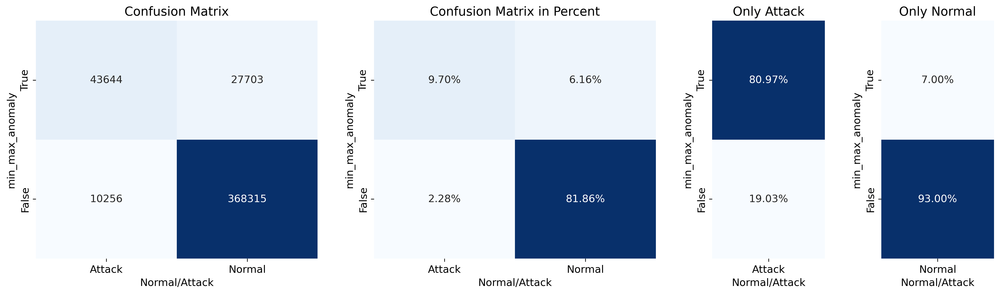

In [ ]:
# create a heatmap of the min_max_anomaly and Normal/Attack
df_cyclic_train, df_cyclic_test = get_train_test_dataset(df_cyclic)
# fig, ax = plt.subplots(1, 4, figsize=(20, 5), dpi=300) 

fig = plt.figure(figsize=(20, 5), dpi=300)
# make plot with 5 rows and 1 column
gs = fig.add_gridspec(1, 6)

plt.rcParams.update({'font.size': 12})

# add a subplot to the figure with 1 row and 3 column
ax1 = fig.add_subplot(gs[0, 0:2])
sns.heatmap(df_cyclic_test[['min_max_anomaly', 'Normal/Attack']].value_counts().unstack(), annot=True, fmt="d", ax=ax1, cmap='Blues', cbar=False)
ax1.set_title('Confusion Matrix')
ax1.invert_yaxis()

# add a subplot to the figure with 1 row and 3 column
ax2 = fig.add_subplot(gs[0, 2:4])
sns.heatmap(df_cyclic_test[['min_max_anomaly', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax2, cmap='Blues', cbar=False)
ax2.set_title('Confusion Matrix in Percent')
ax2.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column
ax3 = fig.add_subplot(gs[0, 4:5])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Attack']
sns.heatmap(df_cyclic_test_attack[['min_max_anomaly', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax3, cmap='Blues', cbar=False)
ax3.set_title('Only Attack')
ax3.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column 
ax4 = fig.add_subplot(gs[0, 5:6])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Normal']
sns.heatmap(df_cyclic_test_attack[['min_max_anomaly', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax4, cmap='Blues', cbar=False)
ax4.set_title('Only Normal')
ax4.invert_yaxis()

plt.subplots_adjust(hspace=0.5, wspace=0.5)


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
data = pd.DataFrame()
for col in cols_cyclic:
    labels = ['Normal', 'Attack']
    class_report = classification_report(df_cyclic_test['Normal/Attack_int'], df_cyclic_test[f'anomaly_{col}'], target_names=labels, output_dict=True)
    cm = confusion_matrix(df_cyclic_test['Normal/Attack_int'], df_cyclic_test[f'anomaly_{col}'])
    data = pd.concat([data, pd.DataFrame({
        'col': col, 
        'precision_attack': class_report['Attack']['precision'], 
        'precision_normal': class_report['Normal']['precision'], 
        'recall_attack': class_report['Attack']['recall'], 
        'recall_normal': class_report['Normal']['recall'], 
        'f1-score_attack': class_report['Attack']['f1-score'], 
        'f1-score_normal': class_report['Normal']['f1-score'], 
        'count_anomaly': df_cyclic_test[df_cyclic_test[f'anomaly_{col}'] == 1].shape[0],
        'count_normal': df_cyclic_test[df_cyclic_test[f'anomaly_{col}'] == 0].shape[0],
        'attack_well_detected': cm[1][1],
        'normal_well_detected': cm[0][0],
    }, index=[0])], axis=0)

data['attack_wrong_detected'] = data['count_anomaly'] - data['attack_well_detected']
data['normal_wrong_detected'] = data['count_normal'] - data['normal_well_detected']

data.index = data['col']
data = data.sort_values(by='count_anomaly', ascending=False)

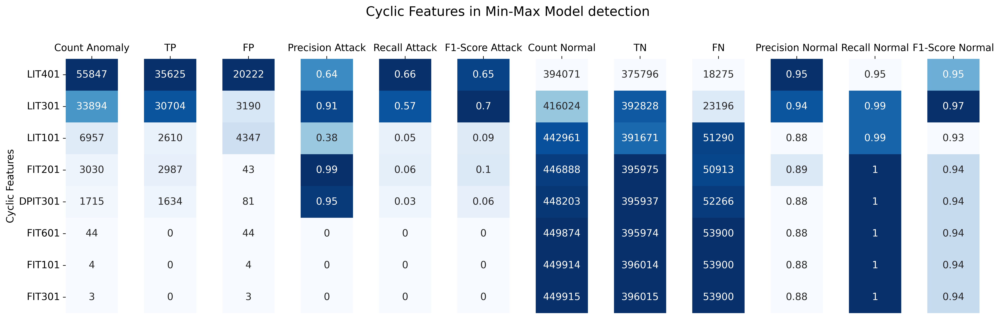

In [ ]:
fig = plt.figure(figsize=(20, 6), dpi=400)

fig.suptitle('Cyclic Features in Min-Max Model detection', fontsize=16)

fig.subplots_adjust(top=0.83)

plt.rcParams.update({'font.size': 12})

gs = fig.add_gridspec(1, 12)

cols_keep = ['count_anomaly', 'attack_well_detected', 'attack_wrong_detected', 'precision_attack', 'recall_attack', 'f1-score_attack', 
             'count_normal', 'normal_well_detected', 'normal_wrong_detected', 'precision_normal', 'recall_normal', 'f1-score_normal', ]
cols_name = ['Count Anomaly', 'TP', 'FP', 'Precision Attack', 'Recall Attack', 'F1-Score Attack',
                'Count Normal', 'TN', 'FN', 'Precision Normal', 'Recall Normal', 'F1-Score Normal']

# add a subplot to the figure with 1 row and 1 column
ax1 = fig.add_subplot(gs[0, 0:1])
sns.heatmap(pd.DataFrame(data[cols_keep[0]]), annot=True, fmt="g", ax=ax1, cmap='Blues', cbar=False)
ax1.xaxis.tick_top()
ax1.set_xticklabels([cols_name[0]])
ax1.set_ylabel('Cyclic Features')

for i in range(1, 12):
    ax2 = fig.add_subplot(gs[0, i:i+1])
    sns.heatmap(pd.DataFrame(np.round(data[cols_keep[i]], 2)), annot=True, fmt="g", ax=ax2, cmap='Blues', cbar=False)
    ax2.xaxis.tick_top()
    ax2.set_xticklabels([cols_name[i]])
    ax2.set_ylabel('')
    ax2.yaxis.set_visible(False)

plt.subplots_adjust(wspace=0.5)

fig.savefig('cyclic_features_min_max.pdf', bbox_inches='tight')

## Variance Zero Model

In [ ]:
df_var_zero = df[cols_var_zero_discrete+['Normal/Attack', 'Timestamp']].copy()
df_var_zero['anomaly_var_zero'] = False

for col in cols_var_zero_discrete:
   
    df_var_zero[f'anomaly_var_zero_{col}'] = df_var_zero[col] != df_var_zero_mean[df_var_zero_mean['col'] == col]['mean'].values[0]
    
    df_var_zero['anomaly_var_zero'] |= df_var_zero[f'anomaly_var_zero_{col}']
        
df_var_zero_train, df_var_zero_test = get_train_test_dataset(df_var_zero)

In [ ]:
df_cyclic['anomaly_var_zero'] = df_var_zero['anomaly_var_zero']

### Accuracy

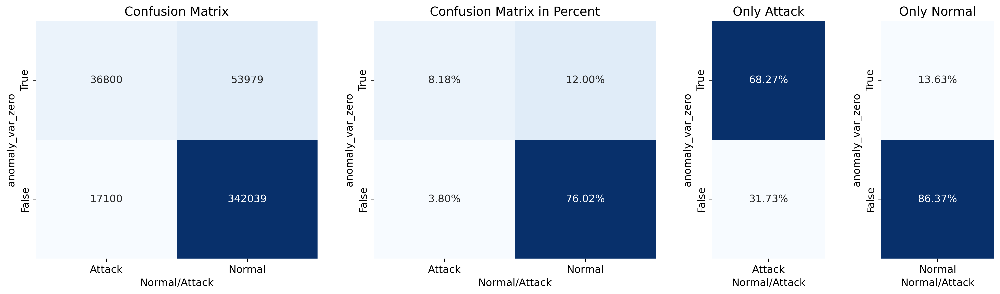

In [ ]:
# create a heatmap of the min_max_anomaly and Normal/Attack
df_cyclic_train, df_cyclic_test = get_train_test_dataset(df_cyclic)
# fig, ax = plt.subplots(1, 4, figsize=(20, 5), dpi=300) 

fig = plt.figure(figsize=(20, 5), dpi=300)
# make plot with 5 rows and 1 column
gs = fig.add_gridspec(1, 6)

plt.rcParams.update({'font.size': 12})

# add a subplot to the figure with 1 row and 3 column
ax1 = fig.add_subplot(gs[0, 0:2])
sns.heatmap(df_cyclic_test[['anomaly_var_zero', 'Normal/Attack']].value_counts().unstack(), annot=True, fmt="d", ax=ax1, cmap='Blues', cbar=False)
ax1.set_title('Confusion Matrix')
ax1.invert_yaxis()

# add a subplot to the figure with 1 row and 3 column
ax2 = fig.add_subplot(gs[0, 2:4])
sns.heatmap(df_cyclic_test[['anomaly_var_zero', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax2, cmap='Blues', cbar=False)
ax2.set_title('Confusion Matrix in Percent')
ax2.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column
ax3 = fig.add_subplot(gs[0, 4:5])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Attack']
sns.heatmap(df_cyclic_test_attack[['anomaly_var_zero', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax3, cmap='Blues', cbar=False)
ax3.set_title('Only Attack')
ax3.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column 
ax4 = fig.add_subplot(gs[0, 5:6])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Normal']
sns.heatmap(df_cyclic_test_attack[['anomaly_var_zero', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax4, cmap='Blues', cbar=False)
ax4.set_title('Only Normal')
ax4.invert_yaxis()

plt.subplots_adjust(hspace=0.5, wspace=0.5)


In [ ]:
df_var_zero_test['Normal/Attack_int'] = df_var_zero_test['Normal/Attack'].apply(lambda x: 1 if x == 'Attack' else 0)

data_var_zero = pd.DataFrame()
for col in cols_var_zero_discrete:
    # class_report = classification_report(df_cyclic_test['Normal/Attack_int'], df_cyclic_test[f'anomaly_{col}'], output_dict=True)
    labels = ['Normal', 'Attack']
    class_report = classification_report(df_var_zero_test['Normal/Attack_int'], df_var_zero_test[f'anomaly_var_zero_{col}'], target_names=labels, output_dict=True)
    cm = confusion_matrix(df_cyclic_test['Normal/Attack_int'], df_var_zero_test[f'anomaly_var_zero_{col}'])
    data_var_zero = pd.concat([data_var_zero, pd.DataFrame({
        'col': col, 
        'precision_attack': class_report['Attack']['precision'], 
        'precision_normal': class_report['Normal']['precision'], 
        'recall_attack': class_report['Attack']['recall'], 
        'recall_normal': class_report['Normal']['recall'], 
        'f1-score_attack': class_report['Attack']['f1-score'], 
        'f1-score_normal': class_report['Normal']['f1-score'], 
        'count_anomaly': df_var_zero_test[df_var_zero_test[f'anomaly_var_zero_{col}'] == 1].shape[0],
        'count_normal': df_var_zero_test[df_var_zero_test[f'anomaly_var_zero_{col}'] == 0].shape[0],
        'attack_well_detected': cm[1][1],
        'normal_well_detected': cm[0][0],
    }, index=[0])], axis=0)

data_var_zero['attack_wrong_detected'] = data_var_zero['count_anomaly'] - data_var_zero['attack_well_detected']
data_var_zero['normal_wrong_detected'] = data_var_zero['count_normal'] - data_var_zero['normal_well_detected']

data_var_zero.index = data_var_zero['col']
data_var_zero = data_var_zero.sort_values(by='count_anomaly', ascending=False)

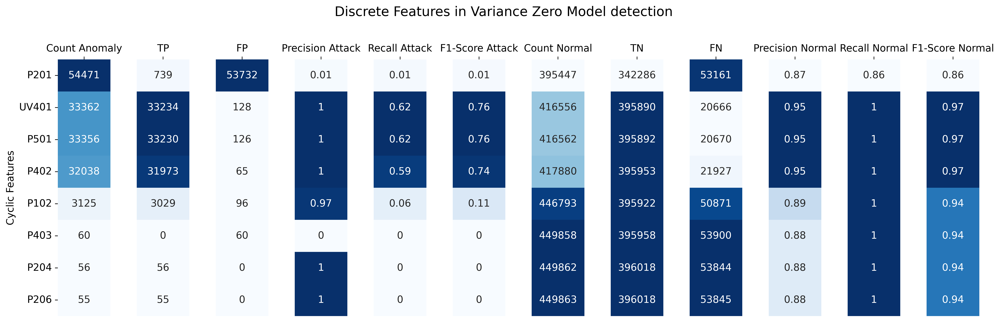

In [ ]:
# fig, ax = plt.subplots(figsize=(20, 5), dpi=300)
fig = plt.figure(figsize=(20, 6), dpi=400)

fig.suptitle('Discrete Features in Variance Zero Model detection', fontsize=16)

fig.subplots_adjust(top=0.83)

plt.rcParams.update({'font.size': 12})

gs = fig.add_gridspec(1, 12)

cols_keep = ['count_anomaly', 'attack_well_detected', 'attack_wrong_detected', 'precision_attack', 'recall_attack', 'f1-score_attack', 
             'count_normal', 'normal_well_detected', 'normal_wrong_detected', 'precision_normal', 'recall_normal', 'f1-score_normal', ]
cols_name = ['Count Anomaly', 'TP', 'FP', 'Precision Attack', 'Recall Attack', 'F1-Score Attack',
                'Count Normal', 'TN', 'FN', 'Precision Normal', 'Recall Normal', 'F1-Score Normal']

# add a subplot to the figure with 1 row and 1 column
ax1 = fig.add_subplot(gs[0, 0:1])
sns.heatmap(pd.DataFrame(data_var_zero[cols_keep[0]]), annot=True, fmt="g", ax=ax1, cmap='Blues', cbar=False)
ax1.xaxis.tick_top()
ax1.set_xticklabels([cols_name[0]])
ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0)
ax1.set_ylabel('Cyclic Features')

for i in range(1, 12):
    ax2 = fig.add_subplot(gs[0, i:i+1])
    sns.heatmap(pd.DataFrame(np.round(data_var_zero[cols_keep[i]], 2)), annot=True, fmt="g", ax=ax2, cmap='Blues', cbar=False)
    ax2.xaxis.tick_top()
    ax2.set_xticklabels([cols_name[i]])
    ax2.set_ylabel('')
    ax2.yaxis.set_visible(False)

plt.subplots_adjust(wspace=0.5)

fig.savefig('discrete_features_var_zero_metrics.pdf', bbox_inches='tight')

### Anomaly with P201

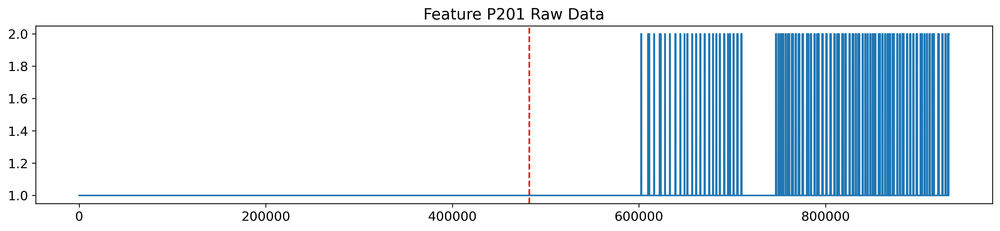

In [823]:
fig, ax = plt.subplots(figsize=(16, 3), dpi=300)
ax.plot(df['P201'], label='P201 Raw data')

ax.axvline(x=df[df['Timestamp'] == '2015-12-28 10:00:00'].index, color='red', linestyle='--')
ax.set_title('Feature P201 Raw Data')
fig.savefig('P201_raw_data.pdf', bbox_inches='tight')

## Longest Slope Direction 

In [465]:

def get_islands_index_continuous(arr, mask, col):
    
    df_diff = arr[[col, 'Timestamp']].copy()
    df_diff['diff'] = [1] + list(np.diff(arr[col]))
    mask = df_diff['diff'] == 0
    
    mask_ = np.concatenate(( [False], mask, [False] ))
    idx = np.flatnonzero(mask_ [1:] != mask_ [:-1])
    arr[f'anomaly_LS_{col}'] = 0
    arr[f'slope_LS_{col}'] = 0
    
    for i in range(0, len(idx), 2):
        len_ = len(arr[idx[i]:idx[i+1] + 1])
        arr.loc[idx[i]:idx[i+1], f'slope_LS_{col}'] = [i for i in range(len_)]
        
    train_arr, _ = get_train_test_dataset(arr[[f'slope_LS_{col}', 'Timestamp']])
    min_ = train_arr[f'slope_LS_{col}'].min()
    max_ = train_arr[f'slope_LS_{col}'].max()

    arr.loc[(arr[f'slope_LS_{col}'] < min_) | (arr[f'slope_LS_{col}'] > max_), f'anomaly_LS_{col}'] = 1
    return arr



In [ ]:
model_longest_slope = pd.DataFrame(columns=['col', 'min_up_down', 'max_up_down', 'min_null_smooth', 'max_null_smooth', 'min_null_strict', 'max_null_strict'])

for col in cols_cyclic:
    
    n = 100
    train_moving_median = get_moving_median(train, col, n)
    up_down_train = get_up_down_one(train_moving_median, n)
    df_null_train = get_null(train_moving_median, n)
    
    arr = get_islands_index_continuous(train, mask, col)
    
    col_df = pd.DataFrame({
        'col': [col],
        'min_up_down': [up_down_train['up_down'].min()],
        'max_up_down': [up_down_train['up_down'].max()],
        'min_null_smooth': [df_null_train['null'].min()],
        'max_null_smooth': [df_null_train['null'].max()],
        'min_null_strict': [arr[f'slope_LS_{col}'].min()],
        'max_null_strict': [arr[f'slope_LS_{col}'].max()],
    })
    model_longest_slope = pd.concat(objs=[model_longest_slope, col_df], axis=0, ignore_index=True)

model_longest_slope

,col,min_up_down,max_up_down,min_null_smooth,max_null_smooth,min_null_strict,max_null_strict
0,FIT101,-1,86,0.0,41.0,0.0,1598.0
1,LIT101,-8,52,0.0,9.0,0.0,5.0
2,FIT201,-1,85,0.0,32.0,0.0,1139.0
3,DPIT301,-2,24,0.0,17.0,0.0,607.0
4,FIT301,-1,104,0.0,19.0,0.0,625.0
5,LIT301,-7,38,0.0,5.0,0.0,5.0
6,LIT401,-8,18,0.0,1.0,0.0,5.0
7,FIT601,1,4824,1.0,4824.0,0.0,4171.0


In [540]:
def check_anomaly_longest_slope(df, col):
    df[f'anomaly_up_down_{col}'] = 0
    df[f'anomaly_null_smooth_{col}'] = 0
    df[f'anomaly_null_strict_{col}'] = 0
    
    df_moving_median = get_moving_median(df, col, 100)
    up_down = get_up_down_one(df_moving_median, 100)
    df_null = get_null(df_moving_median, 100)
    arr = get_islands_index_continuous(df, mask, col)

    min_up_down = model_longest_slope[model_longest_slope['col'] == col]['min_up_down'].values[0]
    max_up_down = model_longest_slope[model_longest_slope['col'] == col]['max_up_down'].values[0]
    
    min_null = model_longest_slope[model_longest_slope['col'] == col]['min_null_smooth'].values[0]
    max_null = model_longest_slope[model_longest_slope['col'] == col]['max_null_smooth'].values[0]
    
    min_null_strict = model_longest_slope[model_longest_slope['col'] == col]['min_null_strict'].values[0]
    max_null_strict = model_longest_slope[model_longest_slope['col'] == col]['max_null_strict'].values[0]
    
    df = pd.concat(objs=[up_down, df_null, arr], axis=1)
    if min_up_down > 0:
        df.loc[(df[f'slope_LS_{col}'] < min_null_strict) | (df[f'slope_LS_{col}'] > max_null_strict), f'anomaly_null_strict_{col}'] = 1
    else:
        df.loc[(df['up_down'] < min_up_down) | (df['up_down'] > max_up_down), f'anomaly_up_down_{col}'] = 1
        df.loc[(df['null'] < min_null) | (df['null'] > max_null), f'anomaly_null_smooth_{col}'] = 1
        df.loc[(df[f'slope_LS_{col}'] < min_null_strict) | (df[f'slope_LS_{col}'] > max_null_strict), f'anomaly_null_strict_{col}'] = 1
    
    df = df.drop(columns=['up_down', 'null'])
    return df


In [505]:
for col in cols_cyclic:
    df_cyclic = check_anomaly_longest_slope(df_cyclic, col)
# ~3 min

In [542]:
df_cyclic['longest_slope_anomaly'] = False
for col in cols_cyclic:
    df_cyclic['longest_slope_anomaly'] |= df_cyclic[f'anomaly_up_down_{col}'].astype(bool)
    df_cyclic['longest_slope_anomaly'] |= df_cyclic[f'anomaly_null_smooth_{col}'].astype(bool)
    df_cyclic['longest_slope_anomaly'] |= df_cyclic[f'anomaly_null_strict_{col}'].astype(bool)

train_cyclic, test_cyclic = get_train_test_dataset(df_cyclic)

In [543]:
test_cyclic[['longest_slope_anomaly', 'Normal/Attack']].value_counts()

longest_slope_anomaly  Normal/Attack
False                  Normal           368822
True                   Attack            43303
                       Normal            27196
False                  Attack            10597
dtype: int64

### Example of detection

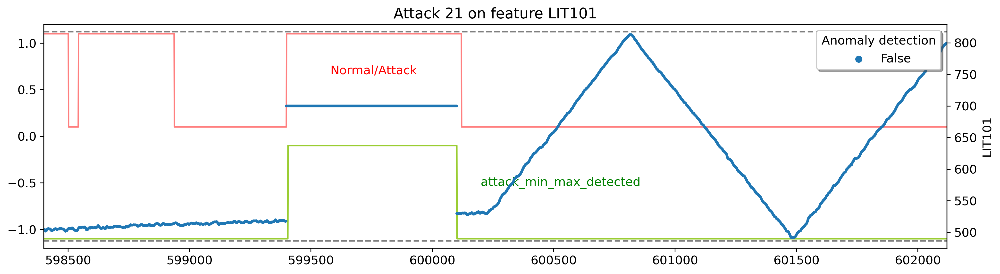

In [544]:
fig, ax = plt.subplots(1, 1, figsize=(16, 4), dpi=300)

col = 'LIT101'
min_ = train[col].min()
max_ = train[col].max()

index_min, index_max = get_timestamp_attack(index_attack=21, offset=2000)
index_min+= 1000
ax.text(index_min + 1800, -0.5, f'attack_min_max_detected', horizontalalignment='left', verticalalignment='center', color='green')
ax.plot(df_cyclic.iloc[index_min:index_max]['longest_slope_anomaly'] - 1.1, color='yellowgreen', alpha=1)


ax.text(index_min + 1180, 0.7, f'Normal/Attack', horizontalalignment='left', verticalalignment='center', color='red')
ax.plot(df_cyclic['Normal/Attack_int'][index_min:index_max] + 0.1, color='red', alpha=0.5)

ax1 = ax.twinx()
data = df[col][index_min:index_max].to_frame()
data['anomaly_detection'] = False
data.loc[data[col] < min_, 'anomaly_detection'] = True

sns.scatterplot(data=data, x=data.index, y=data[col], hue=data['anomaly_detection'], ax=ax1, s=7, linewidth=0)
# ax1.plot(data, color='blue', alpha=0.5)
ax1.axhline(y=min_, color='black', alpha=0.5, linestyle='--')
ax1.axhline(y=max_, color='black', alpha=0.5, linestyle='--')

ax.set_ylim(-1.2, 1.2)
ax.set_xlim(index_min, index_max)

ax.set_title(f'Attack 21 on feature {col}')
ax1.legend(loc='upper right', ncol=1, shadow=True, title='Anomaly detection')


### Accuracy

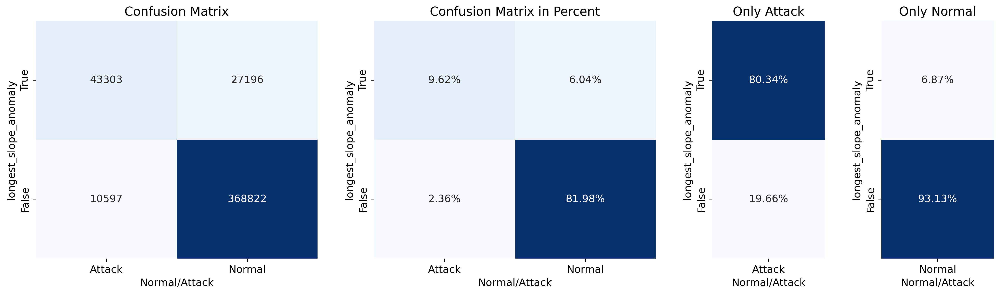

In [795]:
# create a heatmap of the min_max_anomaly and Normal/Attack
df_cyclic_train, df_cyclic_test = get_train_test_dataset(df_cyclic)
# fig, ax = plt.subplots(1, 4, figsize=(20, 5), dpi=300) 

fig = plt.figure(figsize=(20, 5), dpi=300)
# make plot with 5 rows and 1 column
gs = fig.add_gridspec(1, 6)

plt.rcParams.update({'font.size': 12})

# add a subplot to the figure with 1 row and 3 column
ax1 = fig.add_subplot(gs[0, 0:2])
sns.heatmap(df_cyclic_test[['longest_slope_anomaly', 'Normal/Attack']].value_counts().unstack(), annot=True, fmt="d", ax=ax1, cmap='Blues', cbar=False)
ax1.set_title('Confusion Matrix')
ax1.invert_yaxis()

# add a subplot to the figure with 1 row and 3 column
ax2 = fig.add_subplot(gs[0, 2:4])
sns.heatmap(df_cyclic_test[['longest_slope_anomaly', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax2, cmap='Blues', cbar=False)
ax2.set_title('Confusion Matrix in Percent')
ax2.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column
ax3 = fig.add_subplot(gs[0, 4:5])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Attack']
sns.heatmap(df_cyclic_test_attack[['longest_slope_anomaly', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax3, cmap='Blues', cbar=False)
ax3.set_title('Only Attack')
ax3.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column 
ax4 = fig.add_subplot(gs[0, 5:6])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Normal']
sns.heatmap(df_cyclic_test_attack[['longest_slope_anomaly', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax4, cmap='Blues', cbar=False)
ax4.set_title('Only Normal')
ax4.invert_yaxis()

plt.subplots_adjust(hspace=0.5, wspace=0.5)


fig.savefig('confusion_matrix_LS_cyclic.pdf', bbox_inches='tight')

In [546]:
test_cyclic['Normal/Attack_int'] = test_cyclic['Normal/Attack'].map({'Normal': 0, 'Attack': 1})

In [547]:

data_LS_cyclic = pd.DataFrame()
for col in cols_cyclic_anomaly:
    labels = ['Normal', 'Attack']
    test_cyclic[f'anomaly_null_smooth_{col}'] = test_cyclic[f'anomaly_null_smooth_{col}'].astype(bool)    
    test_cyclic[f'anomaly_null_strict_{col}'] = test_cyclic[f'anomaly_null_strict_{col}'].astype(bool)
    test_cyclic[f'anomaly_up_down_{col}'] = test_cyclic[f'anomaly_up_down_{col}'].astype(bool)
    test_cyclic_LS = test_cyclic[[f'anomaly_null_smooth_{col}', f'anomaly_null_strict_{col}', f'anomaly_up_down_{col}', 'Normal/Attack_int']]
    
    test_cyclic_LS[f'anomaly_LS_{col}'] = test_cyclic[f'anomaly_null_smooth_{col}'] | test_cyclic[f'anomaly_null_strict_{col}'] | test_cyclic[f'anomaly_up_down_{col}']

    class_report = classification_report(test_cyclic_LS['Normal/Attack_int'], test_cyclic_LS[f'anomaly_LS_{col}'], target_names=labels, output_dict=True)
    cm = confusion_matrix(df_cyclic_test['Normal/Attack_int'], test_cyclic_LS[f'anomaly_LS_{col}'])
    data_LS_cyclic = pd.concat([data_LS_cyclic, pd.DataFrame({
        'col': col, 
        'precision_attack': class_report['Attack']['precision'], 
        'precision_normal': class_report['Normal']['precision'], 
        'recall_attack': class_report['Attack']['recall'], 
        'recall_normal': class_report['Normal']['recall'], 
        'f1-score_attack': class_report['Attack']['f1-score'], 
        'f1-score_normal': class_report['Normal']['f1-score'], 
        'count_anomaly': test_cyclic_LS[test_cyclic_LS[f'anomaly_LS_{col}'] == 1].shape[0],
        'count_normal': test_cyclic_LS[test_cyclic_LS[f'anomaly_LS_{col}'] == 0].shape[0],
        'attack_well_detected': cm[1][1],
        'normal_well_detected': cm[0][0],
    }, index=[0])], axis=0)

data_LS_cyclic['attack_wrong_detected'] = data_LS_cyclic['count_anomaly'] - data_LS_cyclic['attack_well_detected']
data_LS_cyclic['normal_wrong_detected'] = data_LS_cyclic['count_normal'] - data_LS_cyclic['normal_well_detected']

data_LS_cyclic.index = data_LS_cyclic['col']
data_LS_cyclic = data_LS_cyclic.sort_values(by='count_anomaly', ascending=False)

/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/3630250106.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_cyclic_LS[f'anomaly_LS_{col}'] = test_cyclic[f'anomaly_null_smooth_{col}'] | test_cyclic[f'anomaly_null_strict_{col}'] | test_cyclic[f'anomaly_up_down_{col}']
/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/3630250106.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_cyclic_LS[f'anomaly_LS_{col}'] = test_cyclic[f'anomaly_null_smooth_{col}'] | test_cycli

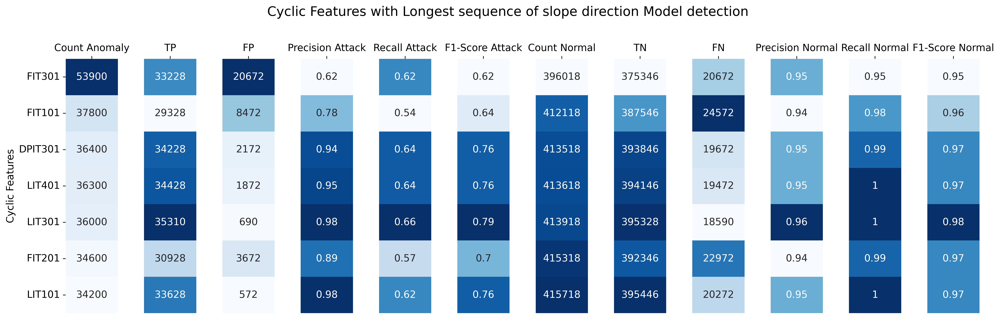

In [378]:
fig = plt.figure(figsize=(20, 6), dpi=400)

fig.suptitle('Cyclic Features with Longest sequence of slope direction Model detection', fontsize=16)
fig.subplots_adjust(top=0.83)

plt.rcParams.update({'font.size': 12})

gs = fig.add_gridspec(1, 12)

cols_keep = ['count_anomaly', 'attack_well_detected', 'attack_wrong_detected', 'precision_attack', 'recall_attack', 'f1-score_attack', 
             'count_normal', 'normal_well_detected', 'normal_wrong_detected', 'precision_normal', 'recall_normal', 'f1-score_normal', ]
cols_name = ['Count Anomaly', 'TP', 'FP', 'Precision Attack', 'Recall Attack', 'F1-Score Attack',
             'Count Normal', 'TN', 'FN', 'Precision Normal', 'Recall Normal', 'F1-Score Normal']

# add a subplot to the figure with 1 row and 1 column
ax1 = fig.add_subplot(gs[0, 0:1])
sns.heatmap(pd.DataFrame(data_LS_cyclic[cols_keep[0]]), annot=True, fmt="g", ax=ax1, cmap='Blues', cbar=False)
ax1.xaxis.tick_top()
ax1.set_xticklabels([cols_name[0]])
ax1.set_ylabel('Cyclic Features')

for i in range(1, 12):
    ax2 = fig.add_subplot(gs[0, i:i+1])
    sns.heatmap(pd.DataFrame(np.round(data_LS_cyclic[cols_keep[i]], 2)), annot=True, fmt="g", ax=ax2, cmap='Blues', cbar=False)
    ax2.xaxis.tick_top()
    ax2.set_xticklabels([cols_name[i]])
    ax2.set_ylabel('')
    ax2.yaxis.set_visible(False)

plt.subplots_adjust(wspace=0.5)

fig.savefig('cyclic_feature_LS_cyclic.pdf', bbox_inches='tight')

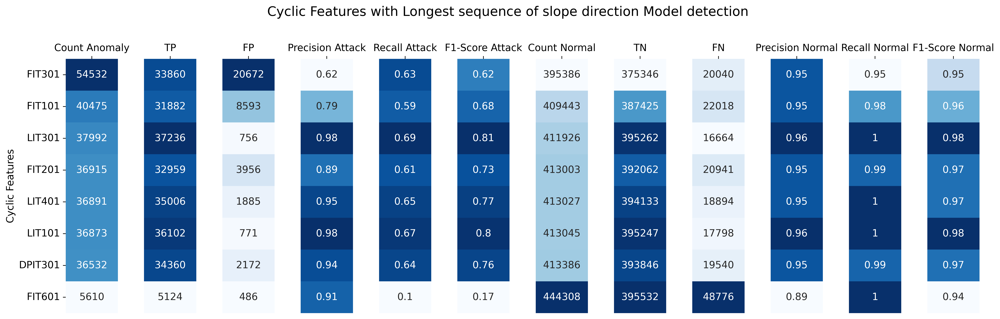

In [549]:
fig = plt.figure(figsize=(20, 6), dpi=400)

fig.suptitle('Cyclic Features with Longest sequence of slope direction Model detection', fontsize=16)
fig.subplots_adjust(top=0.83)

plt.rcParams.update({'font.size': 12})

gs = fig.add_gridspec(1, 12)

cols_keep = ['count_anomaly', 'attack_well_detected', 'attack_wrong_detected', 'precision_attack', 'recall_attack', 'f1-score_attack', 
             'count_normal', 'normal_well_detected', 'normal_wrong_detected', 'precision_normal', 'recall_normal', 'f1-score_normal', ]
cols_name = ['Count Anomaly', 'TP', 'FP', 'Precision Attack', 'Recall Attack', 'F1-Score Attack',
             'Count Normal', 'TN', 'FN', 'Precision Normal', 'Recall Normal', 'F1-Score Normal']

# add a subplot to the figure with 1 row and 1 column
ax1 = fig.add_subplot(gs[0, 0:1])
sns.heatmap(pd.DataFrame(data_LS_cyclic[cols_keep[0]]), annot=True, fmt="g", ax=ax1, cmap='Blues', cbar=False)
ax1.xaxis.tick_top()
ax1.set_xticklabels([cols_name[0]])
ax1.set_ylabel('Cyclic Features')

for i in range(1, 12):
    ax2 = fig.add_subplot(gs[0, i:i+1])
    sns.heatmap(pd.DataFrame(np.round(data_LS_cyclic[cols_keep[i]], 2)), annot=True, fmt="g", ax=ax2, cmap='Blues', cbar=False)
    ax2.xaxis.tick_top()
    ax2.set_xticklabels([cols_name[i]])
    ax2.set_ylabel('')
    ax2.yaxis.set_visible(False)

plt.subplots_adjust(wspace=0.5)

fig.savefig('cyclic_feature_LS_cyclic.pdf', bbox_inches='tight')

## Longest Discrete Value

In [284]:
# Interquartile Range 0.001 - 0.999
def IQR_keep(df, col):

    Q1 = np.quantile(df[col], 0.001)
    Q3 = np.quantile(df[col], 0.999)
    IQR = Q3 - Q1

    # Above Upper bound
    upper = df[col] > (Q3+1.5*IQR)

    # Below Lower bound
    lower = df[col] < (Q1-1.5*IQR)

    keep = ~upper & ~lower
    return Q1, Q3, IQR, keep


def get_islands_index(arr, mask, col, value):
    mask_ = np.concatenate(( [False], mask, [False] ))
    idx = np.flatnonzero(mask_ [1:] != mask_ [:-1])
    
    arr[f'anomaly_{col}_{value}'] = 0
    arr[f'slope_{col}_{value}'] = 0
    
    for i in range(0, len(idx), 2):
        len_ = len(arr[idx[i]:idx[i+1] + 1])
        arr.loc[idx[i]:idx[i+1], f'slope_{col}_{value}'] = [i for i in range(len_)]
        
    train_arr, _ = get_train_test_dataset(arr[[f'slope_{col}_{value}', 'Timestamp']])
    min_ = train_arr[f'slope_{col}_{value}'].min()
    max_ = train_arr[f'slope_{col}_{value}'].max()

    arr.loc[(arr[f'slope_{col}_{value}'] < min_) | (arr[f'slope_{col}_{value}'] > max_), f'anomaly_{col}_{value}'] = 1
    return arr

In [285]:
cols_not_var_zero_discrete = []
for col in cols_discrete:
    if np.var(train[col]) != 0:
        
        Q1, Q3, IQR, keep = IQR_keep(train, col)
        data = train[keep][col]
        if np.var(data) != 0:
            cols_not_var_zero_discrete.append(col)

df_discrete_LS = df[cols_not_var_zero_discrete+['Normal/Attack', 'Timestamp']].copy()
df_discrete_LS['anomaly_discrete_LS'] = False

for col in cols_not_var_zero_discrete:
    unique_value = train[col].unique()

    for value in unique_value:
        mask = df[col] == value
        
        df_discrete_LS = get_islands_index(df_discrete_LS, mask, col, value)
        df_discrete_LS['anomaly_discrete_LS'] |= df_discrete_LS[f'anomaly_{col}_{value}'].astype(bool)

df_discrete_LS_train, df_discrete_LS_test = get_train_test_dataset(df_discrete_LS)

In [353]:
df_cyclic['anomaly_discrete_LS'] = df_discrete_LS['anomaly_discrete_LS']

### Accuracy

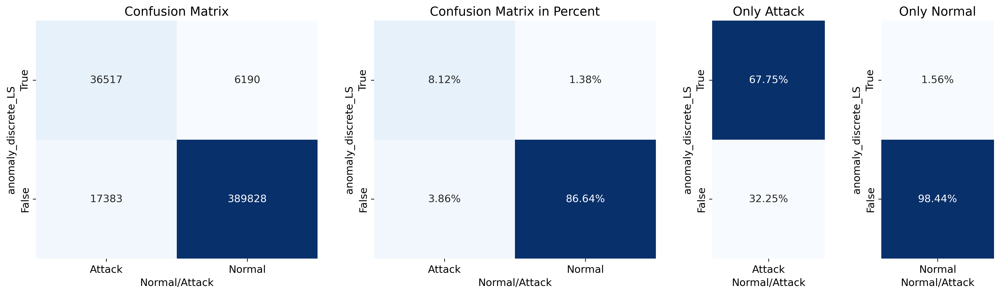

In [796]:
df_cyclic_train, df_cyclic_test = get_train_test_dataset(df_cyclic)

fig = plt.figure(figsize=(20, 5), dpi=300)
# make plot with 5 rows and 1 column
gs = fig.add_gridspec(1, 6)

plt.rcParams.update({'font.size': 12})

# add a subplot to the figure with 1 row and 3 column
ax1 = fig.add_subplot(gs[0, 0:2])
sns.heatmap(df_cyclic_test[['anomaly_discrete_LS', 'Normal/Attack']].value_counts().unstack(), annot=True, fmt="d", ax=ax1, cmap='Blues', cbar=False)
ax1.set_title('Confusion Matrix')
ax1.invert_yaxis()

# add a subplot to the figure with 1 row and 3 column
ax2 = fig.add_subplot(gs[0, 2:4])
sns.heatmap(df_cyclic_test[['anomaly_discrete_LS', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax2, cmap='Blues', cbar=False)
ax2.set_title('Confusion Matrix in Percent')
ax2.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column
ax3 = fig.add_subplot(gs[0, 4:5])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Attack']
sns.heatmap(df_cyclic_test_attack[['anomaly_discrete_LS', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax3, cmap='Blues', cbar=False)
ax3.set_title('Only Attack')
ax3.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column 
ax4 = fig.add_subplot(gs[0, 5:6])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Normal']
sns.heatmap(df_cyclic_test_attack[['anomaly_discrete_LS', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax4, cmap='Blues', cbar=False)
ax4.set_title('Only Normal')
ax4.invert_yaxis()

plt.subplots_adjust(hspace=0.5, wspace=0.5)

fig.savefig('confusion_matrix_LS_discrete.pdf', bbox_inches='tight')

In [288]:
for col in cols_not_var_zero_discrete:
    matching = [s for s in list(df_discrete_LS_test.columns) if col in f'anomaly_{s}' and 'anomaly' in s]
    df_discrete_LS_test[f'anomaly_{col}'] = False
    for c in matching:
        df_discrete_LS_test[f'anomaly_{col}'] |= df_discrete_LS_test[c].astype(bool)

In [339]:
df_discrete_LS_test['Normal/Attack_int'] = df_discrete_LS_test['Normal/Attack'].map({'Normal': 0, 'Attack': 1})

data_LS_discrete = pd.DataFrame()
for col in cols_not_var_zero_discrete:
    # class_report = classification_report(df_cyclic_test['Normal/Attack_int'], df_cyclic_test[f'anomaly_{col}'], output_dict=True)
    labels = ['Normal', 'Attack']
    class_report = classification_report(df_discrete_LS_test['Normal/Attack_int'], df_discrete_LS_test[f'anomaly_{col}'], target_names=labels, output_dict=True)
    cm = confusion_matrix(df_cyclic_test['Normal/Attack_int'], df_discrete_LS_test[f'anomaly_{col}'])
    data_LS_discrete = pd.concat([data_LS_discrete, pd.DataFrame({
        'col': col, 
        'precision_attack': class_report['Attack']['precision'], 
        'precision_normal': class_report['Normal']['precision'], 
        'recall_attack': class_report['Attack']['recall'], 
        'recall_normal': class_report['Normal']['recall'], 
        'f1-score_attack': class_report['Attack']['f1-score'], 
        'f1-score_normal': class_report['Normal']['f1-score'], 
        'count_anomaly': df_discrete_LS_test[df_discrete_LS_test[f'anomaly_{col}'] == 1].shape[0],
        'count_normal': df_discrete_LS_test[df_discrete_LS_test[f'anomaly_{col}'] == 0].shape[0],
        'attack_well_detected': cm[1][1],
        'normal_well_detected': cm[0][0],
    }, index=[0])], axis=0)

data_LS_discrete['attack_wrong_detected'] = data_LS_discrete['count_anomaly'] - data_LS_discrete['attack_well_detected']
data_LS_discrete['normal_wrong_detected'] = data_LS_discrete['count_normal'] - data_LS_discrete['normal_well_detected']

data_LS_discrete.index = data_LS_discrete['col']
data_LS_discrete = data_LS_discrete.sort_values(by='count_anomaly', ascending=False)

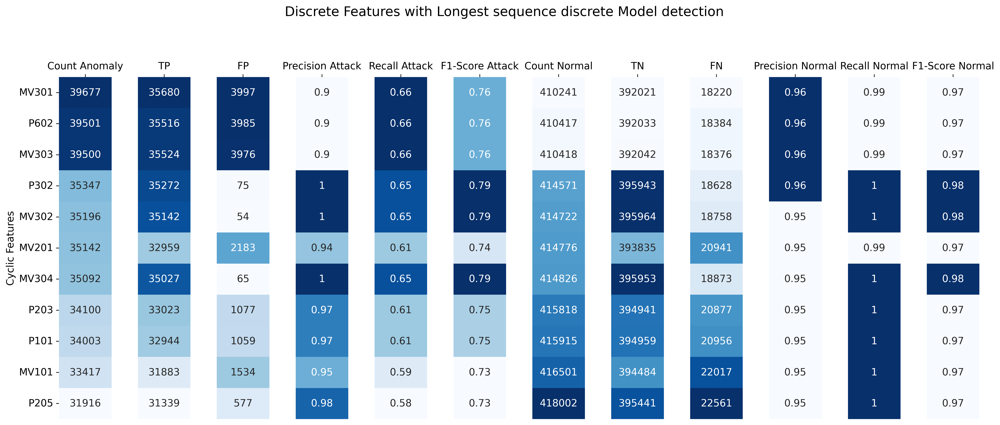

In [377]:
fig = plt.figure(figsize=(20, 8), dpi=400)
# change the title of the figure
fig.suptitle('Discrete Features with Longest sequence discrete Model detection', fontsize=16)

fig.subplots_adjust(top=0.83)

plt.rcParams.update({'font.size': 12})

gs = fig.add_gridspec(1, 12)

cols_keep = ['count_anomaly', 'attack_well_detected', 'attack_wrong_detected', 'precision_attack', 'recall_attack', 'f1-score_attack', 
             'count_normal', 'normal_well_detected', 'normal_wrong_detected', 'precision_normal', 'recall_normal', 'f1-score_normal', ]
cols_name = ['Count Anomaly', 'TP', 'FP', 'Precision Attack', 'Recall Attack', 'F1-Score Attack',
                'Count Normal', 'TN', 'FN', 'Precision Normal', 'Recall Normal', 'F1-Score Normal']

# add a subplot to the figure with 1 row and 1 column
ax1 = fig.add_subplot(gs[0, 0:1])
sns.heatmap(pd.DataFrame(data_LS_discrete[cols_keep[0]]), annot=True, fmt="g", ax=ax1, cmap='Blues', cbar=False)
ax1.xaxis.tick_top()
ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0)
ax1.set_xticklabels([cols_name[0]])
ax1.set_ylabel('Cyclic Features')

for i in range(1, 12):
    ax2 = fig.add_subplot(gs[0, i:i+1])
    sns.heatmap(pd.DataFrame(np.round(data_LS_discrete[cols_keep[i]], 2)), annot=True, fmt="g", ax=ax2, cmap='Blues', cbar=False)
    ax2.xaxis.tick_top()
    ax2.set_xticklabels([cols_name[i]])
    ax2.set_ylabel('')
    ax2.yaxis.set_visible(False)

plt.subplots_adjust(wspace=0.5)

fig.savefig('discrete_feature_LS_discrete.pdf', bbox_inches='tight')

### Delay attack

In [800]:
attack_df['delay'] = attack_df['end_time'] - attack_df['start_time']
attack_df['delay_in_seconds'] = attack_df['delay'].dt.total_seconds()
attack_df[attack_df['num_attack'].isin(attack_LS)][['num_attack', 'delay_in_seconds']]

,num_attack,delay_in_seconds
8,11,560.0
12,17,716.0
17,23,696.0
19,25,611.0
21,27,1690.0
22,28,34208.0
24,30,1170.0
32,38,280.0


In [804]:
df_discrete_LS_test['attack'] = df_cyclic_test['attack']
df_discrete_LS_test_anomaly = df_discrete_LS_test[df_discrete_LS_test['attack'] != 0]
df_discrete_LS_test_anomaly = df_discrete_LS_test_anomaly[df_discrete_LS_test_anomaly['anomaly_discrete_LS'] == True]

In [806]:
attack_LS = df_discrete_LS_test_anomaly['attack'].unique()

In [807]:

for attack in list(attack_LS):
    df_attack = df_cyclic[df_cyclic['attack'] == attack]
    
    for model in ['anomaly_discrete_LS',]:
        delay = (df_attack[df_attack[model] == 1]['Timestamp'].min() - df_attack['Timestamp'].min()).total_seconds()
        print(attack, delay)
        

11 441.0
17 302.0
23 617.0
25 71.0
27 615.0
28 0.0
30 1065.0
38 155.0


## Markov Chain Model

### Creation of state

In [34]:
def get_discrete_status(row, quantiles):
    # point = [i for i in range(quantiles)]
    for i, quantile in enumerate(quantiles):
        if row <= quantile:
            return i
        
    return len(quantiles)

In [719]:
discrete_cols = []

df_state = df[['Timestamp']+cols_discrete].copy()

for col in cols_discrete:
    if col not in cols_var_zero_discrete:
        discrete_cols.append(f'{col}_discrete')
    
for col in cols_acyclic:
    discrete_cols.append(f'{col}_discrete')
    
for col in cols_cyclic:
    discrete_cols.append(f'{col}_discrete')

In [720]:
def get_slope_feature(data, n):

    slope_feature = [0] * 1 + [ x for x in np.diff(np.array(data))]

    slope_adjusted = []
    
    for i in range(0, len(data) - n, n):
        mean = np.mean(slope_feature[i:i+n])
        for j in range(n):
            slope_adjusted.append(mean)
    for j in range(19):
            slope_adjusted.append(mean)
    return pd.DataFrame(slope_adjusted)


def get_moving_median_state(df, col, n):
    median_moving = []
    for i in range(0, len(df) - n, n):
        med = np.median(df.iloc[i:i+n][col])
        for j in range(n):
            median_moving.append(med)
    for j in range(19):
            median_moving.append(med)
    
    return pd.DataFrame(median_moving)

In [721]:
# Add Cols discretes
for col in cols_discrete:
    if col not in cols_var_zero_discrete:
        df_state[f'{col}_discrete'] = df[col]

n = 100
for col in cols_continuous:
    # median_sliding = df[col].rolling(window=n).median()
    # df_state[f'{col}_slope'] = get_slope_feature(median_sliding, n)
    moving_median = get_moving_median_state(df, col, n)
    df_state[f'{col}_slope'] = get_slope_feature(moving_median[0], n)

df_state_train, df_state_test = get_train_test_dataset(df_state)

In [722]:

for col in cols_continuous:
    quantiles =  df_state_train[f'{col}_slope'].quantile([0.001, 0.999])
    df_state[f'{col}_discrete'] = df_state[f'{col}_slope'].apply(lambda x: get_discrete_status(x, quantiles))


In [723]:

def set_state(row):
    state = str('')
    for value in row:
        state += str(value)
    return state

df_state['state'] = df_state[discrete_cols].apply(lambda row: set_state(row), axis=1)

df_state['attack'] = df['attack']
df_state['Normal/Attack'] = df['Normal/Attack']

df_state_train, df_state_test = get_train_test_dataset(df_state)

len(df_state['state'].unique())

1117

### Transition Matrix

In [683]:
data_matrix_train = df_state_train.copy()#[cols_numeric].values

In [684]:
k = len(data_matrix_train['state'].unique())

In [685]:
df_state_unique = data_matrix_train['state'].unique()
df_state_unique = pd.DataFrame(df_state_unique)
df_state_unique.columns = ['state']

df_state_unique = df_state_unique.sort_values(by=['state'])
df_state_unique = df_state_unique.reset_index(drop=True)
df_state_unique = df_state_unique.reset_index()

In [687]:
matrix = np.zeros((k, k), dtype=int)
sum_state = np.zeros((k, 1), dtype=int)

In [688]:
for i in range(len(data_matrix_train)-1):# 450.000
    state_before = data_matrix_train.iloc[i]['state']
    state_after  = data_matrix_train.iloc[i+1]['state']
    
    false_state_before = df_state_unique[df_state_unique['state'] == state_before]['index'].values[0]
    false_state_after  = df_state_unique[df_state_unique['state'] == state_after]['index'].values[0]

    sum_state[false_state_before] += 1
    matrix[false_state_before][false_state_after] += 1
    
# ~34 min for 4000 states
# ~8 mins for 500 states

In [689]:
df_count_state = data_matrix_train['state'].value_counts().rename_axis('state').reset_index(name='counts')
df_merge_count = pd.merge(df_state_unique, df_count_state, on='state', how='left')
sum_state = df_merge_count['counts'].values

In [690]:
transition_matrix = matrix / sum_state
transition_matrix = np.nan_to_num(transition_matrix)
df_transition_matrix = pd.DataFrame(transition_matrix)

In [691]:
df_prob = (sum_state / len(data_matrix_train))
df_prob = np.nan_to_num(df_prob)
df_prob = np.array(df_prob.tolist())

### Probability calculation

In [705]:
df_state_anomaly = df_state_test[['Timestamp', 'state', 'Normal/Attack']]

In [707]:
df_state_anomaly['state_previous'] = df_state_anomaly['state'].shift(1)

/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/3775795393.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_state_anomaly['state_previous'] = df_state_anomaly['state'].shift(1)


In [710]:
def probabiliy_state(state, state_previous):
    is_known = len(df_state[df_state['state'] == state]['index']) > 0
    if is_known == False:
        return 0
    
    index = df_state[df_state['state'] == state]['index'].values[0]
    is_known = len(df_state[df_state['state'] == state_previous]['index']) > 0
    if is_known == False:
        return df_prob[index]
    
    index_previous = df_state[df_state['state'] == state_previous]['index'].values[0]
    return transition_matrix[index_previous][index]

In [711]:
df_state_anomaly['state_probability'] = df_state_anomaly.apply(lambda row: probabiliy_state(row['state'], row['state_previous']), axis=1)

/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/4116870860.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_state_anomaly['state_probability'] = df_state_anomaly.apply(lambda row: probabiliy_state(row['state'], row['state_previous']), axis=1)


In [715]:
df_state_anomaly['anomaly_state'] = df_state_anomaly['state_probability'].apply(lambda x: 0 if x > 0 else 1)

/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/1434266716.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_state_anomaly['anomaly_state'] = df_state_anomaly['state_probability'].apply(lambda x: 0 if x > 0 else 1)


In [1004]:
df_cyclic['state_not_detected'] = df_state_anomaly['anomaly_state'].astype(bool)

In [620]:
keep = ['Timestamp', 'state', 'attack', 'Normal/Attack']
df_state_anomaly = df_state[keep]

df_state_anomaly_train, df_state_anomaly_test = get_train_test_dataset(df_state_anomaly)

know_state = list(df_state_anomaly_train['state'].unique())

df_state_anomaly_train['known'] = 1
df_state_anomaly_test['known'] = df_state_anomaly_test['state'].apply(lambda x: 1 if x in know_state else 0)

df_state_know = pd.concat(objs=[df_state_anomaly_train, df_state_anomaly_test], axis=0)

df_state_know['state_not_detected'] = df_state_know['known'].apply(lambda x: 1 if x == 0 else 0)

state_anomaly_train, state_anomaly_test = get_train_test_dataset(df_state_anomaly)


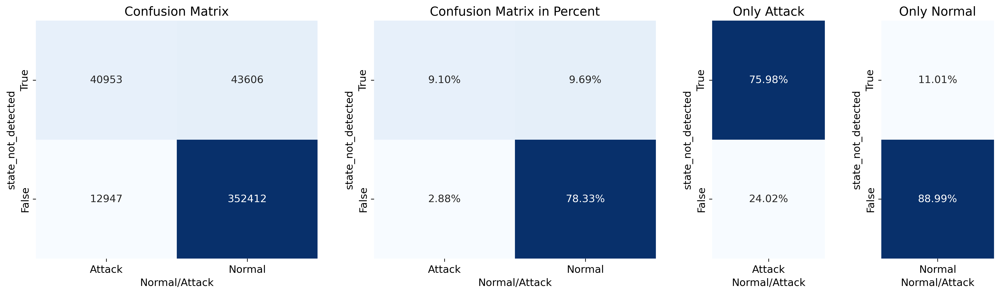

In [728]:
df_cyclic_train, df_cyclic_test = get_train_test_dataset(df_cyclic)

fig = plt.figure(figsize=(20, 5), dpi=300)
# make plot with 5 rows and 1 column
gs = fig.add_gridspec(1, 6)

plt.rcParams.update({'font.size': 12})

# add a subplot to the figure with 1 row and 3 column
ax1 = fig.add_subplot(gs[0, 0:2])
sns.heatmap(df_cyclic_test[['state_not_detected', 'Normal/Attack']].value_counts().unstack(), annot=True, fmt="d", ax=ax1, cmap='Blues', cbar=False)
ax1.set_title('Confusion Matrix')
ax1.invert_yaxis()

# add a subplot to the figure with 1 row and 3 column
ax2 = fig.add_subplot(gs[0, 2:4])
sns.heatmap(df_cyclic_test[['state_not_detected', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax2, cmap='Blues', cbar=False)
ax2.set_title('Confusion Matrix in Percent')
ax2.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column
ax3 = fig.add_subplot(gs[0, 4:5])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Attack']
sns.heatmap(df_cyclic_test_attack[['state_not_detected', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax3, cmap='Blues', cbar=False)
ax3.set_title('Only Attack')
ax3.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column 
ax4 = fig.add_subplot(gs[0, 5:6])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Normal']
sns.heatmap(df_cyclic_test_attack[['state_not_detected', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax4, cmap='Blues', cbar=False)
ax4.set_title('Only Normal')
ax4.invert_yaxis()

plt.subplots_adjust(hspace=0.5, wspace=0.5)

fig.savefig('confusion_matrix_state_anomaly.pdf', bbox_inches='tight')

### Count states

In [625]:
count_states = pd.DataFrame(columns=['state', 'attack'])
list_of_states = []

for i in range(len(df_state)):
    if df_state['state'].iloc[i] not in list_of_states:
        attack = df[df['Timestamp'] == df_state['Timestamp'].iloc[i]]['Normal/Attack'].values[0]
        count_states = pd.concat(objs=[count_states, pd.DataFrame({'state': df_state['state'].iloc[i], 'Timestamp': [df_state['Timestamp'].iloc[i]], 'attack': attack})], axis=0)
        list_of_states.append(df_state['state'].iloc[i])

count_states = count_states.reset_index(drop=True)
count_states['count_state'] = count_states.index

In [626]:
df_count = count_states[['Timestamp', 'count_state']]

df_count_merge = pd.merge(df_count, df, on='Timestamp', how='left')
df_count_merge = df_count_merge[['Timestamp', 'count_state', 'Normal/Attack']]
df_count_merge['Normal/Attack_int'] = df_count_merge['Normal/Attack'].apply(lambda x: 0 if x == 'Normal' else 1)

In [627]:
df_count_merge_train, _ = get_train_test_dataset(df_count_merge)
df_count_merge_train.drop_duplicates(subset=['Timestamp'], keep='first', inplace=True)

In [628]:

train_dup = train.copy()
f = lambda x : x**2

a=20
x = np.linspace(0,len(train_dup), num=len(train_dup))

y =  f(x)
y2 = a * np.log10(y)
train_dup['y'] = y2
train_dup['x'] = x

train_dup = train_dup[['Timestamp', 'y', 'x']]

/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/453278949.py:8: RuntimeWarning: divide by zero encountered in log10
  y2 = a * np.log10(y)


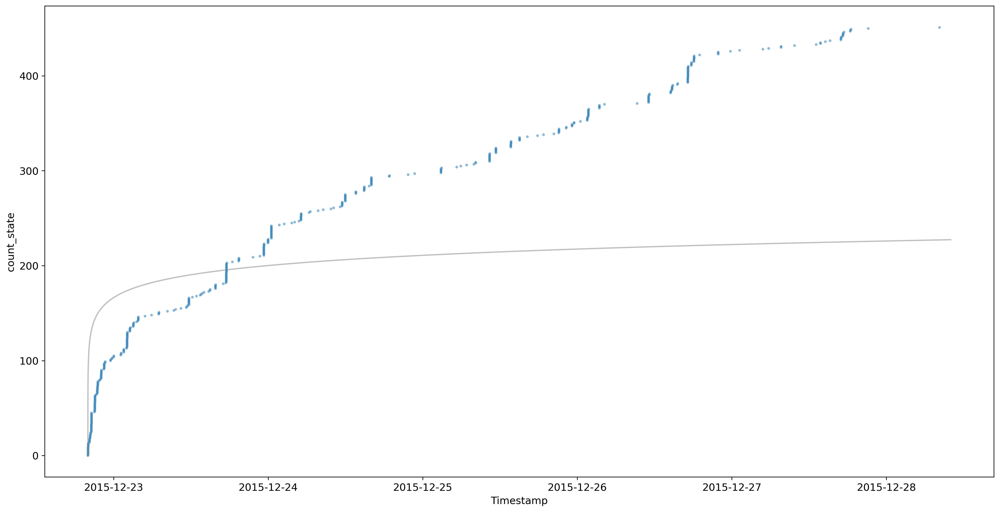

In [629]:
# count_states.plot(x='time', y='index', kind='scatter')
fig, ax = plt.subplots(figsize=(20, 10), dpi=300)
sns.scatterplot(x='Timestamp', y='count_state', data=df_count_merge_train.reset_index(drop=True), s=10, alpha=0.5, marker='o', linewidth=0, ax=ax)

ax.plot(train_dup['Timestamp'], train_dup['y'], label='log10', color='gray', alpha=0.5)


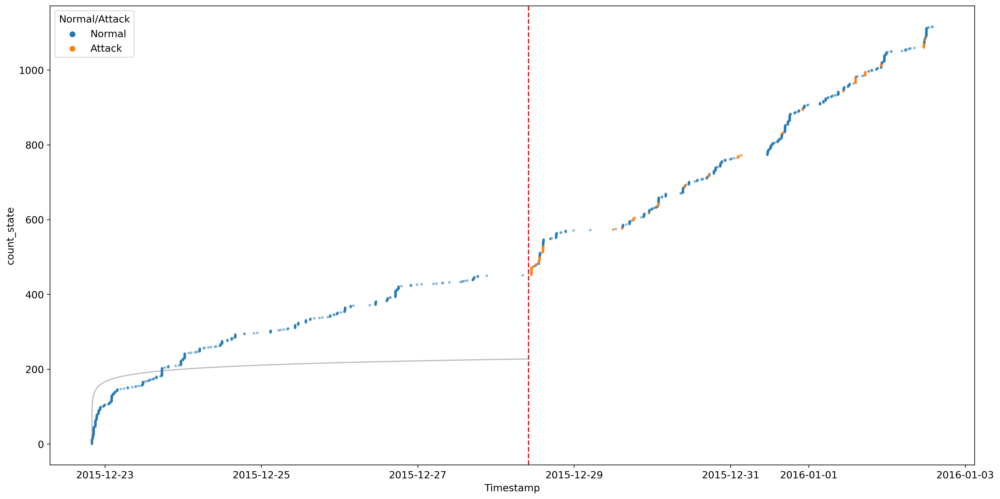

In [630]:
# count_states.plot(x='time', y='index', kind='scatter')
fig, ax = plt.subplots(figsize=(20, 10), dpi=300)
sns.scatterplot(x='Timestamp', y='count_state', data=df_count_merge.reset_index(drop=True), s=10, alpha=0.5, marker='o', linewidth=0, hue='Normal/Attack', ax=ax)
ax.plot(train_dup['Timestamp'], train_dup['y'], label='log10', color='gray', alpha=0.5)

ax.axvline(x=df_state_train['Timestamp'].iloc[-1], color='red', linestyle='--')

# Multi-Model Evaluation

In [729]:
df_cyclic['multimodel_anomaly'] = df_cyclic['min_max_anomaly'] | df_cyclic['state_not_detected'] | df_cyclic['longest_slope_anomaly'] | df_cyclic['anomaly_discrete_LS'] | df_cyclic['anomaly_var_zero']

### Example of multimodel anomaly detection

In [1017]:
def visualize_anomaly(attack, col):
    fig, ax = plt.subplots(1, 1, figsize=(20, 5), dpi=300)

    index_min, index_max = get_timestamp_attack(index_attack=attack, offset=1000)
        
    ax.text(index_min + 50, -5.5 + 0.5, f'attack_multivariate_state_detected', horizontalalignment='left', verticalalignment='center')
    ax.plot(df_cyclic.iloc[index_min:index_max]['state_not_detected'] - 5.5, color='tomato', alpha=1)
    ax.axhline(y=-4.45, color='black', alpha=0.5, linestyle='--')

    ax.text(index_min + 50, -4.4 + 0.5, f'attack_min_max_detected', horizontalalignment='left', verticalalignment='center')
    ax.plot(df_cyclic.iloc[index_min:index_max]['min_max_anomaly'] - 4.4, color='yellowgreen', alpha=1)
    ax.axhline(y=-3.35, color='black', alpha=0.5, linestyle='--')

    ax.text(index_min + 50, -3.3 + 0.5, f'attack_LS_cyclic_detected', horizontalalignment='left', verticalalignment='center')
    ax.plot(df_cyclic.iloc[index_min:index_max]['longest_slope_anomaly'] - 3.3, color='teal', alpha=1)
    ax.axhline(y=-2.25, color='black', alpha=0.5, linestyle='--')

    ax.text(index_min + 50, -2.2 + 0.5, f'attack_LS_discrete_detected', horizontalalignment='left', verticalalignment='center')
    ax.plot(df_cyclic.iloc[index_min:index_max]['anomaly_discrete_LS'] - 2.2, color='maroon', alpha=1)
    ax.axhline(y=-1.15, color='black', alpha=0.5, linestyle='--')

    ax.text(index_min + 50, -1.1 + 0.5, f'attack_var_zero_detected', horizontalalignment='left', verticalalignment='center')
    ax.plot(df_cyclic.iloc[index_min:index_max]['anomaly_var_zero'] - 1.1, color='darkseagreen', alpha=1)
    ax.axhline(y=0, color='black', alpha=0.5, linestyle='--')

    ax.text(index_min + 50, 0.1 + 0.5, f'Normal/Attack', horizontalalignment='left', verticalalignment='center')
    ax.plot(df_cyclic['Normal/Attack_int'][index_min:index_max] + 0.1, color='red', alpha=0.5)

    ax1 = ax.twinx()
    ax1.plot(df[col][index_min:index_max], color='blue', alpha=0.5)

    ax.set_ylim(-5.55, 1.2)
    ax.set_xlim(index_min, index_max)

    ax.set_title(f'Attack {attack}')

    fig.savefig(f'./images/attack_{attack}_multimodel.pdf', bbox_inches='tight')

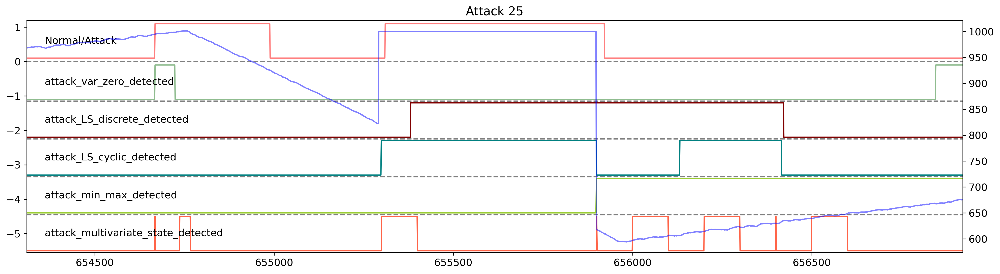

In [1019]:
visualize_anomaly(25, 'LIT401')

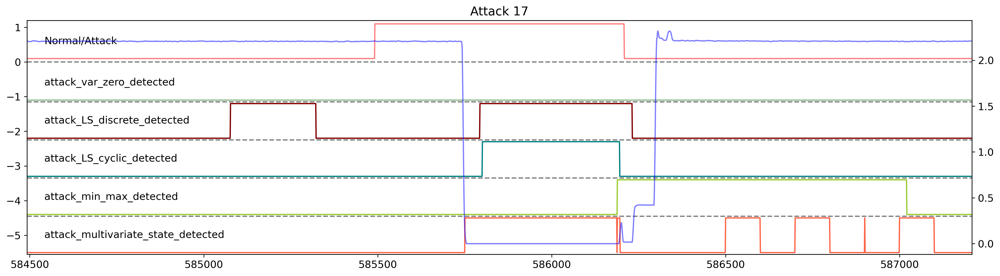

In [1020]:
visualize_anomaly(17, 'FIT301')

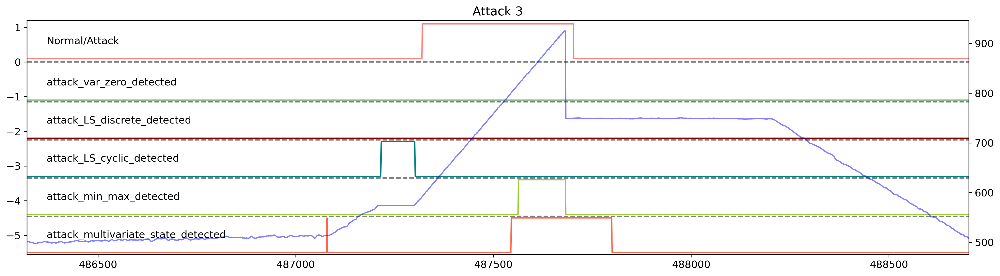

In [1021]:
visualize_anomaly(3, 'LIT101')

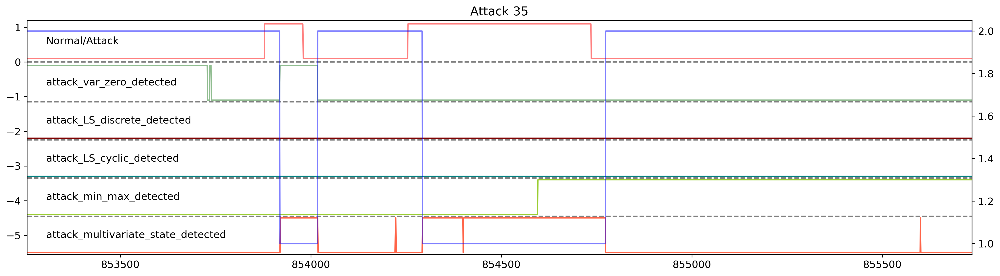

In [1022]:
visualize_anomaly(35, 'P101')

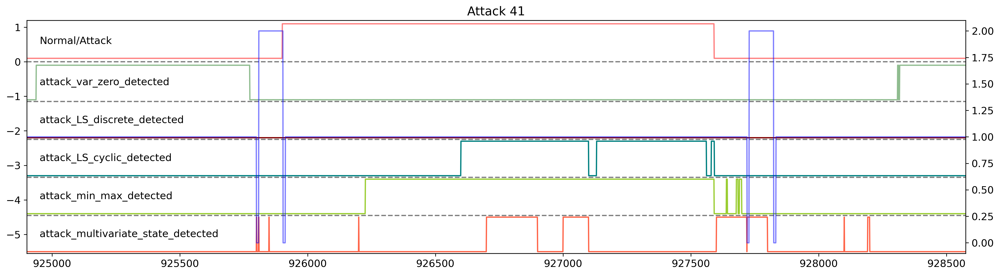

In [1029]:
visualize_anomaly(41, 'MV303')

### Accuracy

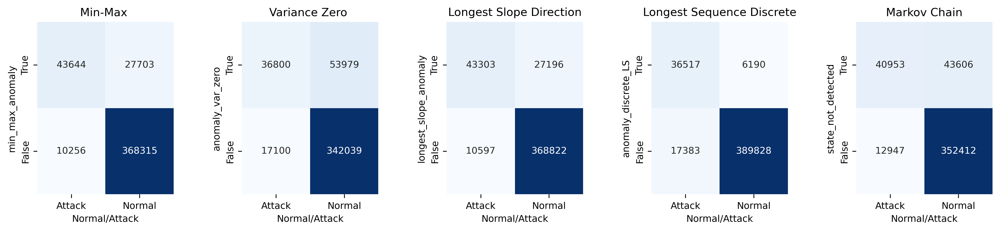

In [732]:
df_cyclic_train, df_cyclic_test = get_train_test_dataset(df_cyclic)

fig = plt.figure(figsize=(20, 3), dpi=300)
# make plot with 5 rows and 1 column
gs = fig.add_gridspec(1, 6)

plt.rcParams.update({'font.size': 9})

# add a subplot to the figure with 1 row and 1 column
ax1 = fig.add_subplot(gs[0, 0:1])
sns.heatmap(df_cyclic_test[['min_max_anomaly', 'Normal/Attack']].value_counts().unstack(), annot=True, fmt="d", ax=ax1, cmap='Blues', cbar=False)
ax1.set_title('Min-Max ')
ax1.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column
ax2 = fig.add_subplot(gs[0, 1:2])
sns.heatmap(df_cyclic_test[['anomaly_var_zero', 'Normal/Attack']].value_counts().unstack(), annot=True, fmt="d", ax=ax2, cmap='Blues', cbar=False)
ax2.set_title('Variance Zero ')
ax2.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column
ax3 = fig.add_subplot(gs[0, 2:3])
sns.heatmap(df_cyclic_test[['longest_slope_anomaly', 'Normal/Attack']].value_counts().unstack(), annot=True, fmt="d", ax=ax3, cmap='Blues', cbar=False)
ax3.set_title('Longest Slope Direction')
ax3.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column
ax4 = fig.add_subplot(gs[0, 3:4])
sns.heatmap(df_cyclic_test[['anomaly_discrete_LS', 'Normal/Attack']].value_counts().unstack(), annot=True, fmt="d", ax=ax4, cmap='Blues', cbar=False)
ax4.set_title('Longest Sequence Discrete')
ax4.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column
ax2 = fig.add_subplot(gs[0, 4:5])
sns.heatmap(df_cyclic_test[['state_not_detected', 'Normal/Attack']].value_counts().unstack(), annot=True, fmt="d", ax=ax2, cmap='Blues', cbar=False)
ax2.set_title('Markov Chain')
ax2.invert_yaxis()

plt.subplots_adjust(hspace=0.5, wspace=0.5)

fig.savefig(f'figures/all_models_confusion_matrix.pdf', bbox_inches='tight')

In [733]:
# make a table in latex for the TP, FP, TN, FN and precision, recall, f1-score, accuracy for each model
df_cyclic_test['Normal/Attack'] = df_cyclic_test['Normal/Attack'].replace({'Normal': 0, 'Attack': 1})

model_name = ['Min-Max', 'Variance Zero', 'Longest Slope Direction', 'Longest Sequence Discrete', 'Markov Chain']

# make a table in latex with the columns: TP, FP, TN, FN, precision, recall, f1-score, accuracy
df_results = pd.DataFrame(columns=['TP', 'FP', 'TN', 'FN', 'precision', 'recall', 'f1-score', 'accuracy'])
for i, model in enumerate(['min_max_anomaly', 'anomaly_var_zero', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'state_not_detected']):
    TP = df_cyclic_test[(df_cyclic_test['Normal/Attack'] == 1) & (df_cyclic_test[model] == 1)].shape[0]
    FP = df_cyclic_test[(df_cyclic_test['Normal/Attack'] == 0) & (df_cyclic_test[model] == 1)].shape[0]
    TN = df_cyclic_test[(df_cyclic_test['Normal/Attack'] == 0) & (df_cyclic_test[model] == 0)].shape[0]
    FN = df_cyclic_test[(df_cyclic_test['Normal/Attack'] == 1) & (df_cyclic_test[model] == 0)].shape[0]
    precision = TP / (TP + FP)
    recall = TP / (TP + FN)
    f1_score = 2 * (precision * recall) / (precision + recall)
    accuracy = (TP + TN) / (TP + FP + TN + FN)
    df_results.loc[model_name[i]] = [TP, FP, TN, FN, precision, recall, f1_score, accuracy]
    
# make TN, FP, FN, TP  in  percentage
df_results['TP'] = df_results['TP'].apply(lambda x: x/df_cyclic_test.shape[0])
df_results['FP'] = df_results['FP'].apply(lambda x: x/df_cyclic_test.shape[0])
df_results['TN'] = df_results['TN'].apply(lambda x: x/df_cyclic_test.shape[0])
df_results['FN'] = df_results['FN'].apply(lambda x: x/df_cyclic_test.shape[0])

# make all the other columns in percentage
df_results = df_results.apply(lambda x: x*100)

# make string with 2 decimals
df_results = df_results.applymap(lambda x: f'{x:.2f}%')

In [734]:

# print a beautiful table in latex 
print(df_results.to_latex(float_format="%.2f"))

\begin{tabular}{lllllllll}
\toprule
{} &     TP &      FP &      TN &     FN & precision &  recall & f1-score & accuracy \\
\midrule
Min-Max                   &  9.70\% &   6.16\% &  81.86\% &  2.28\% &    61.17\% &  80.97\% &   69.69\% &   91.56\% \\
Variance Zero             &  8.18\% &  12.00\% &  76.02\% &  3.80\% &    40.54\% &  68.27\% &   50.87\% &   84.20\% \\
Longest Slope Direction   &  9.62\% &   6.04\% &  81.98\% &  2.36\% &    61.42\% &  80.34\% &   69.62\% &   91.60\% \\
Longest Sequence Discrete &  8.12\% &   1.38\% &  86.64\% &  3.86\% &    85.51\% &  67.75\% &   75.60\% &   94.76\% \\
Markov Chain              &  9.10\% &   9.69\% &  78.33\% &  2.88\% &    48.43\% &  75.98\% &   59.16\% &   87.43\% \\
\bottomrule
\end{tabular}



/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/643387787.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_results.to_latex(float_format="%.2f"))


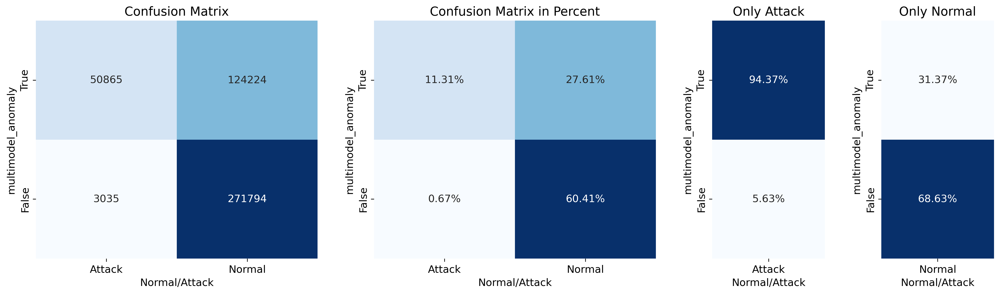

In [735]:
df_cyclic_train, df_cyclic_test = get_train_test_dataset(df_cyclic)

fig = plt.figure(figsize=(20, 5), dpi=300)
# make plot with 5 rows and 1 column
gs = fig.add_gridspec(1, 6)

plt.rcParams.update({'font.size': 12})

# add a subplot to the figure with 1 row and 3 column
ax1 = fig.add_subplot(gs[0, 0:2])
sns.heatmap(df_cyclic_test[['multimodel_anomaly', 'Normal/Attack']].value_counts().unstack(), annot=True, fmt="d", ax=ax1, cmap='Blues', cbar=False)
ax1.set_title('Confusion Matrix')
ax1.invert_yaxis()

# add a subplot to the figure with 1 row and 3 column
ax2 = fig.add_subplot(gs[0, 2:4])
sns.heatmap(df_cyclic_test[['multimodel_anomaly', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax2, cmap='Blues', cbar=False)
ax2.set_title('Confusion Matrix in Percent')
ax2.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column
ax3 = fig.add_subplot(gs[0, 4:5])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Attack']
sns.heatmap(df_cyclic_test_attack[['multimodel_anomaly', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax3, cmap='Blues', cbar=False)
ax3.set_title('Only Attack')
ax3.invert_yaxis()

# add a subplot to the figure with 1 row and 1 column 
ax4 = fig.add_subplot(gs[0, 5:6])
df_cyclic_test_attack = df_cyclic_test[df_cyclic_test['Normal/Attack'] == 'Normal']
sns.heatmap(df_cyclic_test_attack[['multimodel_anomaly', 'Normal/Attack']].value_counts(normalize=True).unstack(), annot=True, fmt=".2%", ax=ax4, cmap='Blues', cbar=False)
ax4.set_title('Only Normal')
ax4.invert_yaxis()

plt.subplots_adjust(hspace=0.5, wspace=0.5)

fig.savefig('figures/confusion_matrix_multimodel.pdf', bbox_inches='tight')

## Anomaly detection for each attack

In [736]:

attacks = list(df_cyclic['attack'].unique())
attacks.remove(0)

df_attack_detected = pd.DataFrame()
for attack in attacks:
    df_attack = df_cyclic[df_cyclic['attack'] == attack]
    
    df_detected = pd.DataFrame({
        'attack': [attack],
        'duration_attack': [len(df_attack)],
        })
    for model in ['min_max_anomaly', 'state_not_detected', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'anomaly_var_zero', 'multimodel_anomaly',]:
        delay = (df_attack[df_attack[model] == 1]['Timestamp'].min() - df_attack['Timestamp'].min()).total_seconds()
        counts_detected = len(df_attack[df_attack[model] == 1])
        counts_not_detected = len(df_attack[df_attack[model] == 0])
        model = model.replace('_not_detected', '_anomaly')
        df_detected = pd.concat(objs=[df_detected, pd.DataFrame({f'{model}_detected': [counts_detected], f'{model}_not_detected': [counts_not_detected], f'{model}_delay': [delay]})], axis=1)
        
    df_attack_detected = pd.concat(objs=[df_attack_detected, df_detected], axis=0)

### Delay of detection for each attack

In [ ]:
failed_attack = [4, 13, 14, 19, 20, 24, 29]

In [ ]:
df_attack_detected_succes = df_attack_detected[~df_attack_detected['attack'].isin(failed_attack)]

In [824]:
col_keep = ['attack', 'duration_attack', 'min_max_anomaly_delay', 'state_anomaly_delay', 'longest_slope_anomaly_delay', 'anomaly_discrete_LS_delay', 'anomaly_var_zero_delay', 'multimodel_anomaly_delay']

matrix = df_attack_detected_succes[col_keep]
matrix.columns = ['attack', 'duration_attack', 'min_max_anomaly_delay', 'state_anomaly_delay', 'longest_slope_anomaly_delay', 'anomaly_discrete_LS_delay', 'anomaly_var_zero_delay', 'multimodel_anomaly_delay']
matrix = matrix.sort_values(by='duration_attack', ascending=False)
matrix = matrix.T
matrix.columns = matrix.iloc[0]
matrix = matrix.drop(matrix.index[0])
# matrix.columns = df_attack_detected['attack'].unique()
matrix = matrix.T

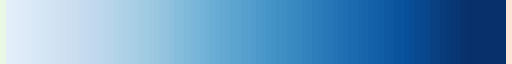

In [825]:

from matplotlib.colors import ListedColormap
import matplotlib
# create a colormap from the list of colors from white to the color blue

flatui = []

# add 20 time the color green nuance
for i in range(0, 1):
    percent = 0.1 + (i * 0.01)
    color = sns.color_palette("Greens", as_cmap=True)(percent)
    hex_cp = matplotlib.colors.to_hex(color)
    flatui.append(hex_cp)
    

for i in range(0, 98):
    percent = 0.1 + (i * 0.01)
    color = sns.color_palette("Blues", as_cmap=True)(percent)
    hex_cp = matplotlib.colors.to_hex(color)
    flatui.append(hex_cp)
    

for i in range(0, 1):
    percent = 0.1 + (i * 0.01)
    color = sns.color_palette("Reds", as_cmap=True)(percent)
    hex_cp = matplotlib.colors.to_hex(color)
    flatui.append(hex_cp)
    
delay_cmap = ListedColormap(sns.color_palette(flatui).as_hex())
delay_cmap

/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/785939336.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matrix_delay[col] = matrix_delay[col] / matrix_duration['duration_attack']


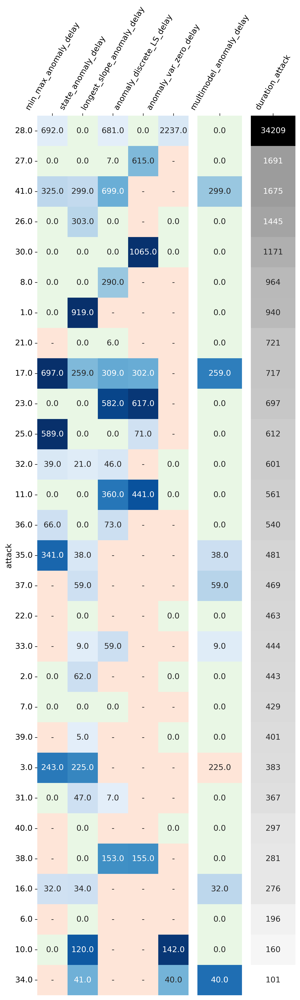

In [826]:
from matplotlib.colors import LogNorm

matrix_duration = matrix['duration_attack'].to_frame()
matrix_delay = matrix[['min_max_anomaly_delay', 'state_anomaly_delay', 'longest_slope_anomaly_delay', 'anomaly_discrete_LS_delay', 'anomaly_var_zero_delay', 'multimodel_anomaly_delay']]


fig = plt.figure(figsize=(7, 24), dpi=300)
# make a grid with 1 row and 5 columns
gs = fig.add_gridspec(1, 5)

matrix_delay_str = matrix_delay.fillna('-')

labels_multimodel = np.array(matrix_delay_str['multimodel_anomaly_delay'].to_frame())
labels = np.array(matrix_delay_str[['min_max_anomaly_delay', 'state_anomaly_delay', 'longest_slope_anomaly_delay', 'anomaly_discrete_LS_delay', 'anomaly_var_zero_delay']])

for col in matrix_delay.columns:
    matrix_delay[col] = matrix_delay[col] / matrix_duration['duration_attack']
matrix_delay = matrix_delay.fillna(1)

matrix_delay_multimodel = matrix_delay['multimodel_anomaly_delay'].to_frame()
matrix_delay = matrix_delay[['min_max_anomaly_delay', 'state_anomaly_delay', 'longest_slope_anomaly_delay', 'anomaly_discrete_LS_delay', 'anomaly_var_zero_delay']]

# add a subplot with 1 column and 1 rows
ax1 = fig.add_subplot(gs[0, 0:3])
sns.heatmap(matrix_delay, cmap=delay_cmap, annot=labels, fmt='', ax=ax1, cbar=False)

ax1.xaxis.tick_top()
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=60)
ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0)

ax2 = fig.add_subplot(gs[0, 3:4])
sns.heatmap(matrix_delay_multimodel, cmap=delay_cmap, annot=labels_multimodel, fmt='', ax=ax2, cbar=False)

ax2.xaxis.tick_top()
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=60)
ax2.yaxis.set_visible(False)

# add a subplot with 4 column and 1 rows
ax3 = fig.add_subplot(gs[0, 4:5])
sns.heatmap(matrix_duration, annot=True, fmt='g', ax=ax3, cmap='Greys', cbar=False, norm=LogNorm())
ax3.yaxis.set_visible(False)
ax3.xaxis.tick_top()
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=60)

fig.savefig('delay_anomaly_detection.pdf', bbox_inches='tight')

### Accuracy of each model and multimodel

In [740]:
failed_attack = [4, 13, 14, 19, 20, 24, 29]

In [989]:
df_attack_detected_succes = df_attack_detected[~df_attack_detected['attack'].isin(failed_attack)]

In [990]:

# calculate the percentage of detected and not detected
for model in ['min_max_anomaly', 'state_anomaly', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'anomaly_var_zero', 'multimodel_anomaly',]:
    df_attack_detected_succes[f'{model}_detected_%'] = np.round(df_attack_detected_succes[f'{model}_detected'] / df_attack_detected_succes['duration_attack'], 2) * 100
    df_attack_detected_succes[f'{model}_not_detected_%'] = np.round(df_attack_detected_succes[f'{model}_not_detected'] / df_attack_detected_succes['duration_attack'], 2) * 100
col_keep = ['attack', 'duration_attack']
for col in df_attack_detected_succes.columns:
    if '%' in col and 'not_' not in col:
        col_keep.append(col)
matrix = df_attack_detected_succes[col_keep]
matrix.columns = ['attack', 'duration_attack', 'min_max_anomaly', 'state_anomaly', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'anomaly_var_zero', 'multimodel_anomaly']
matrix = matrix.sort_values(by='duration_attack')
matrix = matrix.T
matrix.columns = matrix.iloc[0]
matrix = matrix.drop(matrix.index[0])
# matrix.columns = df_attack_detected['attack'].unique()
matrix

/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/862593540.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_attack_detected_succes[f'{model}_detected_%'] = np.round(df_attack_detected_succes[f'{model}_detected'] / df_attack_detected_succes['duration_attack'], 2) * 100
/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/862593540.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_attack_detected_succes[f'{model}_not_detected_%'] = np.round(df_attack_detected_succes[f'{m

attack,34.0,10.0,6.0,16.0,38.0,40.0,31.0,3.0,39.0,7.0,2.0,33.0,22.0,37.0,35.0,36.0,11.0,32.0,25.0,23.0,17.0,21.0,1.0,8.0,30.0,26.0,41.0,27.0,28.0
duration_attack,101.0,160.0,196.0,276.0,281.0,297.0,367.0,383.0,401.0,429.0,443.0,444.0,463.0,469.0,481.0,540.0,561.0,601.0,612.0,697.0,717.0,721.0,940.0,964.0,1171.0,1445.0,1675.0,1691.0,34209.0
min_max_anomaly,0.0,100.0,0.0,83.0,0.0,0.0,100.0,31.0,0.0,100.0,98.0,0.0,0.0,0.0,29.0,88.0,10.0,94.0,4.0,100.0,3.0,0.0,100.0,100.0,100.0,100.0,81.0,32.0,98.0
state_anomaly,59.0,25.0,90.0,88.0,65.0,100.0,87.0,41.0,27.0,27.0,61.0,67.0,100.0,87.0,92.0,100.0,100.0,63.0,15.0,29.0,62.0,17.0,0.0,20.0,7.0,44.0,18.0,4.0,98.0
longest_slope_anomaly,0.0,0.0,0.0,0.0,10.0,0.0,98.0,0.0,0.0,95.0,0.0,87.0,0.0,0.0,0.0,86.0,18.0,92.0,96.0,11.0,55.0,97.0,0.0,68.0,97.0,98.0,56.0,93.0,98.0
anomaly_discrete_LS,0.0,0.0,0.0,0.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0,0.0,88.0,11.0,58.0,0.0,0.0,0.0,5.0,0.0,0.0,64.0,100.0
anomaly_var_zero,60.0,11.0,0.0,0.0,0.0,100.0,0.0,0.0,100.0,0.0,95.0,0.0,96.0,0.0,0.0,0.0,97.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,96.0,98.0,0.0,0.0,93.0
multimodel_anomaly,60.0,100.0,90.0,88.0,74.0,100.0,100.0,41.0,100.0,100.0,98.0,98.0,100.0,87.0,92.0,100.0,100.0,100.0,100.0,100.0,64.0,100.0,100.0,100.0,100.0,100.0,81.0,100.0,100.0


In [992]:
# create a heatmap from the matrix color not based on duration of the attack
matrix.columns = matrix.columns.astype(int)
matrix_percent = matrix
matrix_percent = matrix_percent.drop('duration_attack')
matrix_percent = matrix_percent.drop('multimodel_anomaly')
matrix_duration = matrix.loc['duration_attack'].to_frame().T
matrix_multimodel = matrix.loc['multimodel_anomaly'].to_frame().T

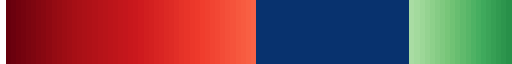

In [993]:

from matplotlib.colors import ListedColormap
import matplotlib
# create a colormap from the list of colors from white to the color blue

flatui = ["#ffffff"]
# add 49 times the color red nuance 
start_percent = 1.00
for i in range(0, 49):
    percent = start_percent - (i * 0.01)
    color = sns.color_palette("Reds", as_cmap=True)(percent)
    hex_cp = matplotlib.colors.to_hex(color)
    flatui.append(hex_cp)
# add 30 times the color blue nuance
for i in range(0, 30):
    flatui.append("#08326e")

# add 20 time the color green nuance
start_percent = 0.75 - 0.02 * 20
for i in range(0, 20):
    percent = start_percent + (i * 0.02)
    color = sns.color_palette("Greens", as_cmap=True)(percent)
    hex_cp = matplotlib.colors.to_hex(color)
    flatui.append(hex_cp)
my_cmap = ListedColormap(sns.color_palette(flatui).as_hex())
my_cmap

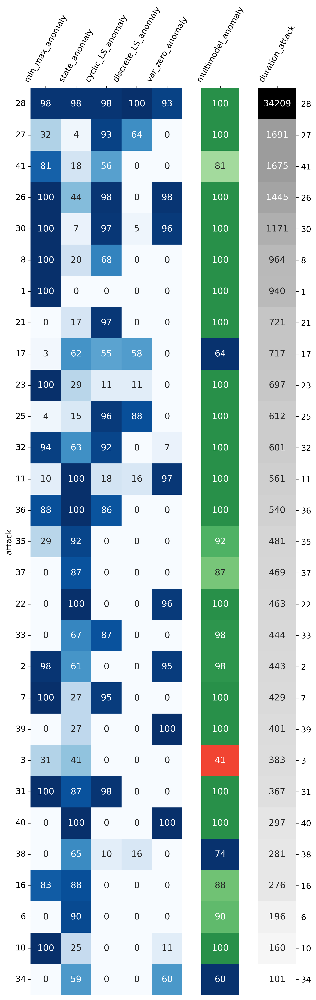

In [994]:
from matplotlib.colors import LogNorm

fig = plt.figure(figsize=(7, 24), dpi=300)
# make plot with 5 rows and 1 column
gs = fig.add_gridspec(1, 5)

# add a subplot to the figure with 3 first column and 1 row
ax1 = fig.add_subplot(gs[0, 0:3])
data_plot = matrix_percent.T
data_plot.columns = ['min_max_anomaly', 'state_anomaly', 'cyclic_LS_anomaly', 'discrete_LS_anomaly', 'var_zero_anomaly']
sns.heatmap(data_plot, cmap=sns.color_palette("Blues", as_cmap=True), annot=True, fmt='g', ax=ax1, cbar=False)
ax1.xaxis.tick_top()
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=60)
ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0)
ax1.invert_yaxis()
# change font size of value in heatmap
for text in ax1.texts:
    text.set_size(13)


# add a subplot to the figure with 1 row and 1 column
ax2 = fig.add_subplot(gs[0, 3:4])
sns.heatmap(matrix_multimodel.T, cmap=my_cmap, annot=True, fmt='g', ax=ax2, cbar=False, vmin=0, vmax=100)
ax2.xaxis.tick_top()
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=60)
ax2.set_yticklabels(ax2.get_yticklabels(), rotation=0)
ax2.yaxis.set_visible(False)
ax2.invert_yaxis()
for text in ax2.texts:
    text.set_size(13)

# add a subplot to the figure with 1 row and 1 column
ax3 = fig.add_subplot(gs[0, 4:5])
sns.heatmap(matrix_duration.T, cmap='Greys', annot=True, fmt='g', ax=ax3, cbar=False, norm=LogNorm())
ax3.xaxis.tick_top()
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=60)
ax3.set_yticklabels(ax3.get_yticklabels(), rotation=0)
ax3.set_xlabel('')
ax3.invert_yaxis()
ax3.yaxis.tick_right()
# hide y label
ax3.set_ylabel('')
for text in ax3.texts:
    text.set_size(13)

plt.subplots_adjust(wspace=0.5)

fig.savefig('accuracy_global.pdf', bbox_inches='tight')

### Each model on failed attack

In [560]:
failed_attack = [4, 13, 14, 19, 20, 24, 29]

In [747]:
df_attack_detected_failed = df_attack_detected[df_attack_detected['attack'].isin(failed_attack)]

In [748]:
df_attack_detected_failed

,attack,duration_attack,min_max_anomaly_detected,min_max_anomaly_not_detected,min_max_anomaly_delay,state_anomaly_detected,state_anomaly_not_detected,state_anomaly_delay,longest_slope_anomaly_detected,longest_slope_anomaly_not_detected,longest_slope_anomaly_delay,anomaly_discrete_LS_detected,anomaly_discrete_LS_not_detected,anomaly_discrete_LS_delay,anomaly_var_zero_detected,anomaly_var_zero_not_detected,anomaly_var_zero_delay,multimodel_anomaly_detected,multimodel_anomaly_not_detected,multimodel_anomaly_delay
0,4,390,0,390,NaN,0,390,NaN,0,390,NaN,0,390,NaN,0,390,NaN,0,390,NaN
0,13,233,0,233,NaN,0,233,NaN,0,233,NaN,0,233,NaN,0,233,NaN,0,233,NaN
0,14,431,0,431,NaN,0,431,NaN,0,431,NaN,0,431,NaN,0,431,NaN,0,431,NaN
0,19,259,0,259,NaN,21,238,38.0,0,259,NaN,0,259,NaN,0,259,NaN,21,238,38.0
0,20,395,0,395,NaN,57,338,0.0,0,395,NaN,0,395,NaN,0,395,NaN,57,338,0.0
0,24,321,0,321,NaN,31,290,0.0,0,321,NaN,0,321,NaN,56,265,0.0,86,235,0.0
0,29,121,0,121,NaN,41,80,80.0,0,121,NaN,0,121,NaN,0,121,NaN,41,80,80.0


In [749]:

# calculate the percentage of detected and not detected
for model in ['min_max_anomaly', 'state_anomaly', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'anomaly_var_zero', 'multimodel_anomaly',]:
    df_attack_detected_failed[f'{model}_detected_%'] = np.round(df_attack_detected_failed[f'{model}_detected'] / df_attack_detected_failed['duration_attack'], 2) * 100
    df_attack_detected_failed[f'{model}_not_detected_%'] = np.round(df_attack_detected_failed[f'{model}_not_detected'] / df_attack_detected_failed['duration_attack'], 2) * 100
col_keep = ['attack', 'duration_attack']
for col in df_attack_detected_failed.columns:
    if '%' in col and 'not_' not in col:
        col_keep.append(col)
matrix_failed = df_attack_detected_failed[col_keep]
matrix_failed.columns = ['attack', 'duration_attack', 'min_max_anomaly', 'state_anomaly', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'anomaly_var_zero', 'multimodel_anomaly']
matrix_failed = matrix_failed.sort_values(by='duration_attack')
matrix_failed = matrix_failed.T
matrix_failed.columns = matrix_failed.iloc[0]
matrix_failed = matrix_failed.drop(matrix_failed.index[0])
# matrix_failed.columns = df_attack_detected['attack'].unique()
matrix_failed

/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/192583004.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_attack_detected_failed[f'{model}_detected_%'] = np.round(df_attack_detected_failed[f'{model}_detected'] / df_attack_detected_failed['duration_attack'], 2) * 100
/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/192583004.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_attack_detected_failed[f'{model}_not_detected_%'] = np.round(df_attack_detected_failed[f'{m

attack,29.0,13.0,19.0,24.0,4.0,20.0,14.0
duration_attack,121.0,233.0,259.0,321.0,390.0,395.0,431.0
min_max_anomaly,0.0,0.0,0.0,0.0,0.0,0.0,0.0
state_anomaly,34.0,0.0,8.0,10.0,0.0,14.0,0.0
longest_slope_anomaly,0.0,0.0,0.0,0.0,0.0,0.0,0.0
anomaly_discrete_LS,0.0,0.0,0.0,0.0,0.0,0.0,0.0
anomaly_var_zero,0.0,0.0,0.0,17.0,0.0,0.0,0.0
multimodel_anomaly,34.0,0.0,8.0,27.0,0.0,14.0,0.0


In [750]:
# create a heatmap from the matrix color not based on duration of the attack
matrix_failed.columns = matrix_failed.columns.astype(int)
matrix_failed_percent = matrix_failed
matrix_failed_percent = matrix_failed_percent.drop('duration_attack')
matrix_failed_percent = matrix_failed_percent.drop('multimodel_anomaly')
matrix_failed_duration = matrix_failed.loc['duration_attack'].to_frame().T
matrix_failed_multimodel = matrix_failed.loc['multimodel_anomaly'].to_frame().T

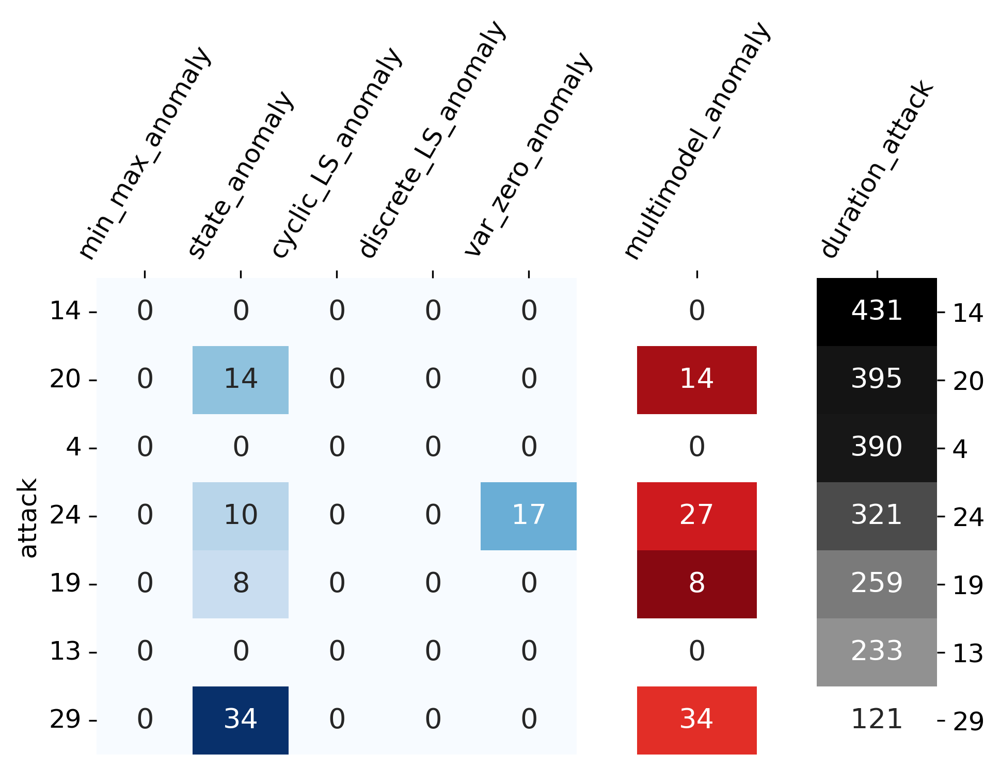

In [751]:
from matplotlib.colors import LogNorm

fig = plt.figure(figsize=(7, 4), dpi=300)
# make plot with 5 rows and 1 column
gs = fig.add_gridspec(1, 5)

# add a subplot to the figure with 3 first column and 1 row
ax1 = fig.add_subplot(gs[0, 0:3])
data_plot = matrix_failed_percent.T
data_plot.columns = ['min_max_anomaly', 'state_anomaly', 'cyclic_LS_anomaly', 'discrete_LS_anomaly', 'var_zero_anomaly']
sns.heatmap(data_plot, cmap=sns.color_palette("Blues", as_cmap=True), annot=True, fmt='g', ax=ax1, cbar=False)
ax1.xaxis.tick_top()
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=60)
ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0)
ax1.invert_yaxis()
# change font size of value in heatmap
for text in ax1.texts:
    text.set_size(13)


# add a subplot to the figure with 1 row and 1 column
ax2 = fig.add_subplot(gs[0, 3:4])
sns.heatmap(matrix_failed_multimodel.T, cmap=my_cmap, annot=True, fmt='g', ax=ax2, cbar=False, vmin=0, vmax=100)
ax2.xaxis.tick_top()
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=60)
ax2.set_yticklabels(ax2.get_yticklabels(), rotation=0)
ax2.yaxis.set_visible(False)
ax2.invert_yaxis()
for text in ax2.texts:
    text.set_size(13)

# add a subplot to the figure with 1 row and 1 column
ax3 = fig.add_subplot(gs[0, 4:5])
sns.heatmap(matrix_failed_duration.T, cmap='Greys', annot=True, fmt='g', ax=ax3, cbar=False, norm=LogNorm())
ax3.xaxis.tick_top()
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=60)
ax3.set_yticklabels(ax3.get_yticklabels(), rotation=0)
ax3.set_xlabel('')
ax3.invert_yaxis()
ax3.yaxis.tick_right()
# hide y label
ax3.set_ylabel('')
for text in ax3.texts:
    text.set_size(13)

plt.subplots_adjust(wspace=0.5)

fig.savefig('figures/accuracy_on_failed_attacks.pdf', bbox_inches='tight')

### Anomaly detection on Type of attack

In [ ]:
failed_attack = [4, 13, 14, 19, 20, 24, 29]

In [827]:
df_attack_detected_succes = df_attack_detected[~df_attack_detected['attack'].isin(failed_attack)]

In [830]:
attack_df['attack_type'].value_counts()

Single Stage Single Point Attacks    23
Single Stage Multi Point Attacks      6
Multi Stage Single Point Attacks      4
Multi Stage Multi Point Attacks       3
Name: attack_type, dtype: int64

In [868]:
attack_df_dup = attack_df.copy()
attack_df_dup = attack_df_dup.drop(columns=['attack'])
# change the column num_attack by attack
attack_df_dup = attack_df_dup.rename(columns={'num_attack': 'attack'})
df_attack_detected_succes_type = df_attack_detected_succes.merge(attack_df_dup[['attack', 'attack_type']], on='attack', how='left')

In [876]:
# change value of attack_type to be more readable
df_attack_detected_succes_type['attack_type'] = df_attack_detected_succes_type['attack_type'].replace(
    {'Single Stage Single Point Attacks': 'SSSP', 
     'Single Stage Multi Point Attacks': 'SSMP',
     'Multi Stage Single Point Attacks': 'MSSP',
     'Multi Stage Multi Point Attacks': 'MSMP'})

In [881]:

# calculate the percentage of detected and not detected
for model in ['min_max_anomaly', 'state_anomaly', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'anomaly_var_zero', 'multimodel_anomaly',]:
    df_attack_detected_succes_type[f'{model}_detected_%'] = np.round(df_attack_detected_succes_type[f'{model}_detected'] / df_attack_detected_succes_type['duration_attack'], 2) * 100
    df_attack_detected_succes_type[f'{model}_not_detected_%'] = np.round(df_attack_detected_succes_type[f'{model}_not_detected'] / df_attack_detected_succes_type['duration_attack'], 2) * 100
    
    
col_keep = ['attack', 'duration_attack', 'attack_type']
for col in df_attack_detected_succes_type.columns:
    if '%' in col and 'not_' not in col:
        col_keep.append(col)
        
        
matrix = df_attack_detected_succes_type[col_keep]
matrix.columns = ['attack', 'duration_attack', 'attack_type', 'min_max_anomaly', 'state_anomaly', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'anomaly_var_zero', 'multimodel_anomaly']
matrix = matrix.sort_values(by=['attack_type', 'duration_attack'])
matrix = matrix.T
matrix.columns = matrix.iloc[0]
matrix = matrix.drop(matrix.index[0])
# matrix.columns = df_attack_detected['attack'].unique()
matrix

attack,22,23,30,38,39,26,27,37,35,25,21,34,10,6,16,40,31,3,7,2,33,36,11,32,17,1,8,41,28
duration_attack,463,697,1171,281,401,1445,1691,469,481,612,721,101,160,196,276,297,367,383,429,443,444,540,561,601,717,940,964,1675,34209
attack_type,MSMP,MSMP,MSMP,MSSP,MSSP,MSSP,MSSP,SSMP,SSMP,SSMP,SSMP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP,SSSP
min_max_anomaly,0.0,100.0,100.0,0.0,0.0,100.0,32.0,0.0,29.0,4.0,0.0,0.0,100.0,0.0,83.0,0.0,100.0,31.0,100.0,98.0,0.0,88.0,10.0,94.0,3.0,100.0,100.0,81.0,98.0
state_anomaly,100.0,29.0,7.0,65.0,27.0,44.0,4.0,87.0,92.0,15.0,17.0,59.0,25.0,90.0,88.0,100.0,87.0,41.0,27.0,61.0,67.0,100.0,100.0,63.0,62.0,0.0,20.0,18.0,98.0
longest_slope_anomaly,0.0,11.0,97.0,10.0,0.0,98.0,93.0,0.0,0.0,96.0,97.0,0.0,0.0,0.0,0.0,0.0,98.0,0.0,95.0,0.0,87.0,86.0,18.0,92.0,55.0,0.0,68.0,56.0,98.0
anomaly_discrete_LS,0.0,11.0,5.0,16.0,0.0,0.0,64.0,0.0,0.0,88.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0,0.0,58.0,0.0,0.0,0.0,100.0
anomaly_var_zero,96.0,0.0,96.0,0.0,100.0,98.0,0.0,0.0,0.0,0.0,0.0,60.0,11.0,0.0,0.0,100.0,0.0,0.0,0.0,95.0,0.0,0.0,97.0,7.0,0.0,0.0,0.0,0.0,93.0
multimodel_anomaly,100.0,100.0,100.0,74.0,100.0,100.0,100.0,87.0,92.0,100.0,100.0,60.0,100.0,90.0,88.0,100.0,100.0,41.0,100.0,98.0,98.0,100.0,100.0,100.0,64.0,100.0,100.0,81.0,100.0


In [885]:
# create a heatmap from the matrix color not based on duration of the attack
matrix.columns = matrix.columns.astype(int)
matrix_percent = matrix
matrix_percent = matrix_percent.drop('attack_type')
matrix_percent = matrix_percent.drop('duration_attack')
matrix_percent = matrix_percent.drop('multimodel_anomaly')
matrix_attack_type = matrix.loc['attack_type'].to_frame().T
matrix_duration = matrix.loc['duration_attack'].to_frame().T
matrix_multimodel = matrix.loc['multimodel_anomaly'].to_frame().T

ValueError: could not convert string to float: 'MSMP'

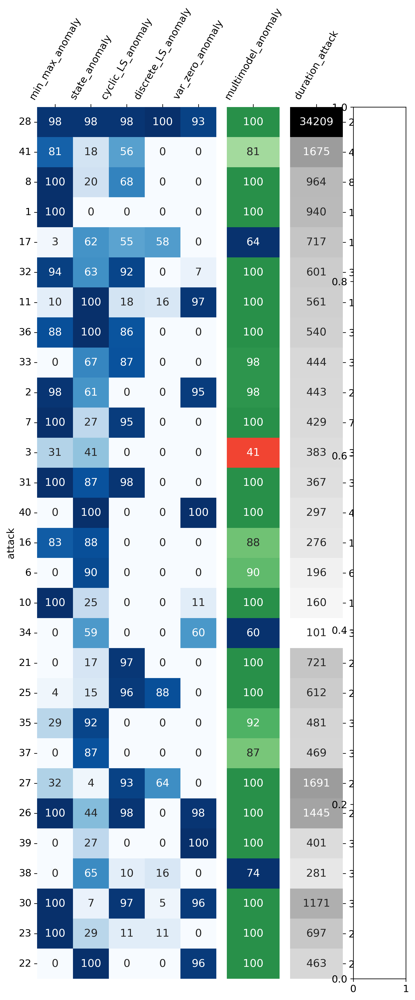

In [898]:
from matplotlib.colors import LogNorm

fig = plt.figure(figsize=(8, 19), dpi=300)
# make plot with 6 rows and 1 column
gs = fig.add_gridspec(1, 6)

# add a subplot to the figure with 3 first column and 1 row
ax1 = fig.add_subplot(gs[0, 0:3])
data_plot = matrix_percent.T
data_plot.columns = ['min_max_anomaly', 'state_anomaly', 'cyclic_LS_anomaly', 'discrete_LS_anomaly', 'var_zero_anomaly']
data_plot = data_plot.astype(float)
sns.heatmap(data_plot, cmap=sns.color_palette("Blues", as_cmap=True), annot=True, fmt='g', ax=ax1, cbar=False)
ax1.xaxis.tick_top()
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=60)
ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0)
ax1.invert_yaxis()
# change font size of value in heatmap
for text in ax1.texts:
    text.set_size(13)


# add a subplot to the figure with 1 row and 1 column
ax2 = fig.add_subplot(gs[0, 3:4])
sns.heatmap(matrix_multimodel.T.astype(float), cmap=my_cmap, annot=True, fmt='g', ax=ax2, cbar=False, vmin=0, vmax=100)
ax2.xaxis.tick_top()
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=60)
ax2.set_yticklabels(ax2.get_yticklabels(), rotation=0)
ax2.yaxis.set_visible(False)
ax2.invert_yaxis()
for text in ax2.texts:
    text.set_size(13)

# add a subplot to the figure with 1 row and 1 column
ax3 = fig.add_subplot(gs[0, 4:5])
sns.heatmap(matrix_duration.T.astype(float), cmap='Greys', annot=True, fmt='g', ax=ax3, cbar=False, norm=LogNorm())
ax3.xaxis.tick_top()
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=60)
ax3.set_yticklabels(ax3.get_yticklabels(), rotation=0)
ax3.set_xlabel('')
ax3.invert_yaxis()
ax3.yaxis.tick_right()
# hide y label
ax3.set_ylabel('')
for text in ax3.texts:
    text.set_size(13)

# add a subplot to the figure with 1 row and 1 column
ax4 = fig.add_subplot(gs[0, 5:6])
sns.heatmap(matrix_attack_type.T, cmap='Greys', annot=True, fmt='', ax=ax4, cbar=False)
ax4.xaxis.tick_top()
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=60)
ax4.set_yticklabels(ax4.get_yticklabels(), rotation=0)
ax4.set_xlabel('')
ax4.invert_yaxis()
ax4.yaxis.tick_right()
# hide y label
ax4.set_ylabel('')
for text in ax4.texts:
    text.set_size(13)

plt.subplots_adjust(wspace=0.5)

fig.savefig('figures/accuracy_on_type_attacks.pdf', bbox_inches='tight')

## Multi-models combination

In [927]:
combination_models_anomaly = df_cyclic_test.copy()

In [928]:
models = ['min_max_anomaly', 'state_not_detected', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'anomaly_var_zero']

In [929]:
combination_models_anomaly = combination_models_anomaly[models+['attack', 'Normal/Attack_int']]

In [959]:
models = ['min_max_anomaly', 'state_not_detected', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'anomaly_var_zero']
models_name = ['Min-Max', 'Markov Chain', 'Cyclic LS', 'Discrete LS', 'Variance Zero']

import itertools
# create all possible combination of models
combinations = []
for i in range(1, len(models)+1):
    combinations.extend(list(itertools.combinations(models, i)))

In [941]:
combination_models_anomaly['Normal/Attack'] = combination_models_anomaly['Normal/Attack_int'].astype(bool)

In [954]:
from sklearn.metrics import precision_recall_fscore_support


# create a dataframe with all possible combination of models in index and precision, recall, f1-score in columns
df_combination_models = pd.DataFrame()
for i, combination in enumerate(combinations):
    temporary_df = combination_models_anomaly.copy()
    temporary_df = temporary_df[list(combination)]
    temporary_df['multimodel_anomaly'] = False
    for col in list(combination):
        temporary_df['multimodel_anomaly'] |= temporary_df[col].astype(bool)
        
    labels = ['Normal', 'Attack']
    class_report = classification_report(combination_models_anomaly['Normal/Attack'], temporary_df['multimodel_anomaly'], target_names=labels, output_dict=True)
    cm = confusion_matrix(combination_models_anomaly['Normal/Attack'], temporary_df['multimodel_anomaly'])
    
    df_combination_models.loc[i, 'cnt_combination'] = len(combination)
    df_combination_models.loc[i, 'combination'] = str(combination)
    df_combination_models.loc[i, 'precision_attack'] = class_report['Attack']['precision']
    df_combination_models.loc[i, 'recall_attack'] = class_report['Attack']['recall']
    df_combination_models.loc[i, 'f1-score_attack'] = class_report['Attack']['f1-score']
    df_combination_models.loc[i, 'precision_normal'] = class_report['Normal']['precision']
    df_combination_models.loc[i, 'recall_normal'] = class_report['Normal']['recall']
    df_combination_models.loc[i, 'f1-score_normal'] = class_report['Normal']['f1-score']
    df_combination_models.loc[i, 'TP'] = cm[1,1]
    df_combination_models.loc[i, 'TN'] = cm[0,0]
    df_combination_models.loc[i, 'FP'] = cm[0,1]
    df_combination_models.loc[i, 'FN'] = cm[1,0]

In [988]:
df_comb_4 = df_combination_models[df_combination_models['cnt_combination'] == 5].sort_values(by='f1-score_attack', ascending=False)

df_comb_4['TP'] = df_comb_4['TP'] / len(df_cyclic_test)
df_comb_4['TN'] = df_comb_4['TN'] / len(df_cyclic_test)
df_comb_4['FP'] = df_comb_4['FP'] / len(df_cyclic_test)
df_comb_4['FN'] = df_comb_4['FN'] / len(df_cyclic_test)

# #make round of the values
df_comb_4 = df_comb_4.round(4)
df_comb_4 = df_comb_4 * 100
# df_comb_4 = df_comb_4.astype(int)

cols_keep = ['precision_attack', 'recall_attack', 'f1-score_attack', 'precision_normal', 'recall_normal', 'f1-score_normal', 'TP', 'TN', 'FP', 'FN']
# make a table in latex with the best 4 models
print(df_comb_4[cols_keep].to_latex(index=False, float_format="%.2f", escape=False, column_format='lrrrrrrrrrr', caption='Best 4 models', label='tab:best_4_models'))

\begin{table}
\centering
\caption{Best 4 models}
\label{tab:best_4_models}
\begin{tabular}{lrrrrrrrrrr}
\toprule
 precision_attack &  recall_attack &  f1-score_attack &  precision_normal &  recall_normal &  f1-score_normal &    TP &    TN &    FP &   FN \\
\midrule
            29.05 &          94.37 &            44.43 &             98.90 &          68.63 &            81.03 & 11.31 & 60.41 & 27.61 & 0.67 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_23337/347435656.py:15: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_comb_4[cols_keep].to_latex(index=False, float_format="%.2f", escape=False, column_format='lrrrrrrrrrr', caption='Best 4 models', label='tab:best_4_models'))


In [985]:
df_comb_4

,cnt_combination,combination,precision_attack,recall_attack,f1-score_attack,precision_normal,recall_normal,f1-score_normal,TP,TN,FP,FN
25,4.0,"('min_max_anomaly', 'state_not_detected', 'longest_slope_anomaly', 'anomaly_discrete_LS')",0.379231,0.936827,0.539906,0.989251,0.791282,0.879261,0.112232,0.696487,0.183713,0.007568
28,4.0,"('min_max_anomaly', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'anomaly_var_zero')",0.352446,0.916438,0.509101,0.985460,0.770829,0.865030,0.109789,0.678484,0.201717,0.010011
27,4.0,"('min_max_anomaly', 'state_not_detected', 'anomaly_discrete_LS', 'anomaly_var_zero')",0.306198,0.928534,0.460529,0.986553,0.713644,0.828196,0.111238,0.628150,0.252050,0.008562
29,4.0,"('state_not_detected', 'longest_slope_anomaly', 'anomaly_discrete_LS', 'anomaly_var_zero')",0.301768,0.903859,0.452471,0.982037,0.715356,0.827747,0.108282,0.629657,0.250543,0.011518
26,4.0,"('min_max_anomaly', 'state_not_detected', 'longest_slope_anomaly', 'anomaly_var_zero')",0.290338,0.929443,0.442461,0.986289,0.690797,0.812511,0.111347,0.608040,0.272161,0.008453
